# Data Science 410 BB
## University of Washington Professional & Continuing Education

### Homework 2: Exploring Multivariate Data
### Leo Salemann
### 1/18/18


# Abstract

The heating load of buildings depends on ... Evidence for this relationship can be seen by ... in the figure and by noting .... in the table above.

# Appendix

## Load and examine the data set

In [2]:
read.housing = function(file = 'kc_house_data.csv'){
  ## Read the csv file
  kc.housing <- read.csv(file, header = TRUE, 
                      stringsAsFactors = FALSE)

 
  ## Remove cases or rows with missing values. In this case we keep the 
  ## rows which do not have nas. 
  # bldg.energy[complete.cases(bldg.energy), ]
}

kc.housing = read.housing()

In [3]:
str(kc.housing)

'data.frame':	21613 obs. of  21 variables:
 $ id           : num  7.13e+09 6.41e+09 5.63e+09 2.49e+09 1.95e+09 ...
 $ date         : chr  "20141013T000000" "20141209T000000" "20150225T000000" "20141209T000000" ...
 $ price        : num  221900 538000 180000 604000 510000 ...
 $ bedrooms     : int  3 3 2 4 3 4 3 3 3 3 ...
 $ bathrooms    : num  1 2.25 1 3 2 4.5 2.25 1.5 1 2.5 ...
 $ sqft_living  : int  1180 2570 770 1960 1680 5420 1715 1060 1780 1890 ...
 $ sqft_lot     : int  5650 7242 10000 5000 8080 101930 6819 9711 7470 6560 ...
 $ floors       : num  1 2 1 1 1 1 2 1 1 2 ...
 $ waterfront   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ view         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ condition    : int  3 3 3 5 3 3 3 3 3 3 ...
 $ grade        : int  7 7 6 7 8 11 7 7 7 7 ...
 $ sqft_above   : int  1180 2170 770 1050 1680 3890 1715 1060 1050 1890 ...
 $ sqft_basement: int  0 400 0 910 0 1530 0 0 730 0 ...
 $ yr_built     : int  1955 1951 1933 1965 1987 2001 1995 1963 1960 2003 ...
 $ yr_renovated :

Okay, we've got 21,613 observations at 21 variables each. Dates are encoded (strings), the rest looks pretty clean.

In [4]:
names(kc.housing)

[1] "id"            "date"          "price"         "bedrooms"     
 [5] "bathrooms"     "sqft_living"   "sqft_lot"      "floors"       
 [9] "waterfront"    "view"          "condition"     "grade"        
[13] "sqft_above"    "sqft_basement" "yr_built"      "yr_renovated" 
[17] "zipcode"       "lat"           "long"          "sqft_living15"
[21] "sqft_lot15"

In [6]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ Relative.Compactness + Surface.Area +
                  Wall.Area + Roof.Area + Overall.Height +
                  Orientation + Glazing.Area + 
                  Glazing.Area.Distribution + Heating.Load + 
                  Cooling.Load, data = kc.housing)

ERROR: Error in eval(expr, envir, enclos): object 'Relative.Compactness' not found


## Start by Looking at Everything

In [7]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + 
                  view + condition + grade + sqft_above + sqft_basement + yr_built + yr_renovated + zipcode + 
                  lat + long + sqft_living15 + sqft_lot15, data = kc.housing)

options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + bedrooms 
                  + bathrooms 
                  + floors 
                  
                  + waterfront 
                  + view 
                  + condition 
                  + grade 

                  + yr_built 
                  + yr_renovated                   
                  + zipcode 
                  + lat 
                  + long 
                  
                  + sqft_living 
                  + sqft_lot 
                  + sqft_above 
                  
                  + sqft_basement 
                  + sqft_living15 
                  + sqft_lot15
                  
                  , data = kc.housing)

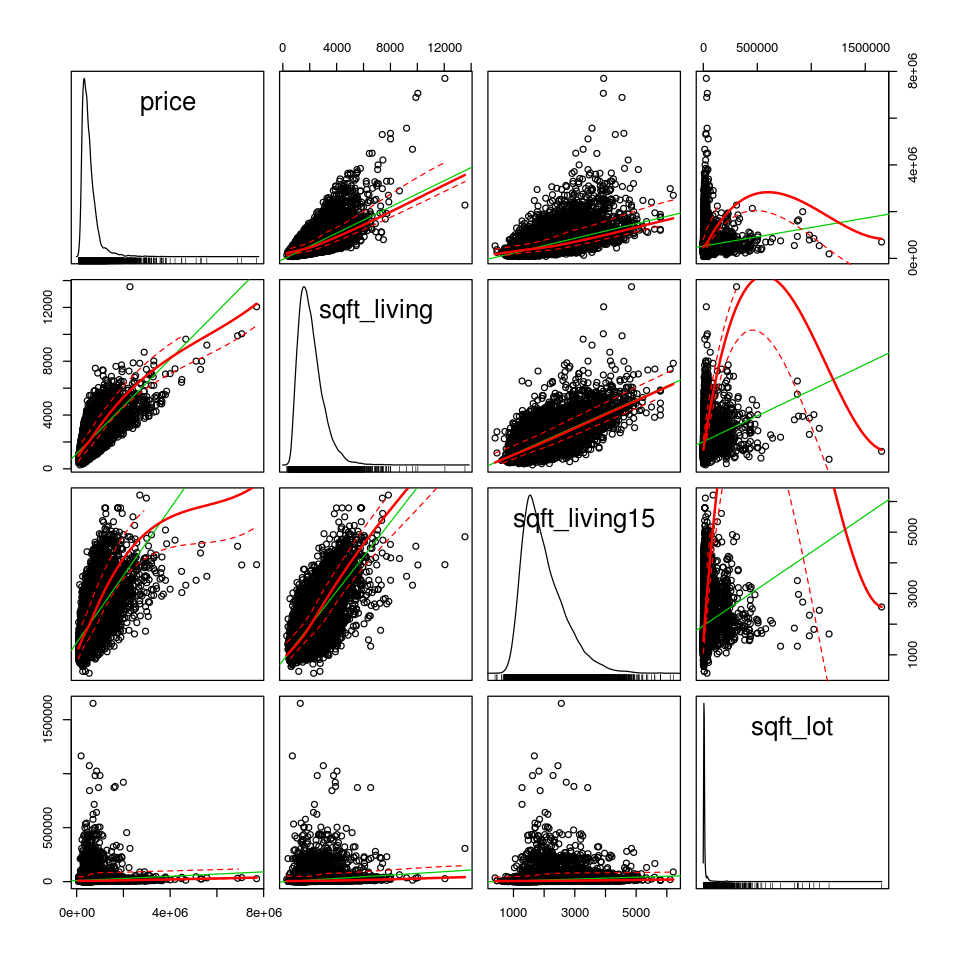

In [8]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price +  sqft_living + sqft_living15 
                  + sqft_lot                  
                  , data = kc.housing)

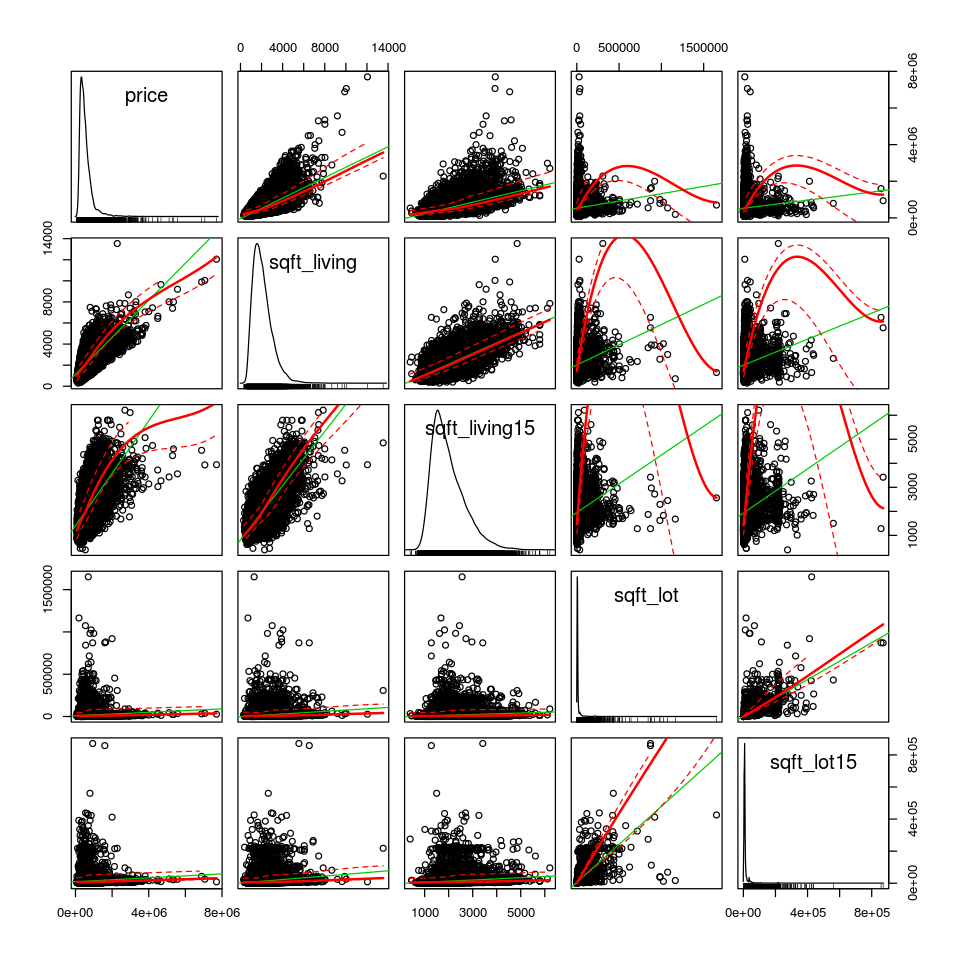

In [9]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price +  sqft_living + sqft_living15 
                  + sqft_lot + sqft_lot15                
                  , data = kc.housing)

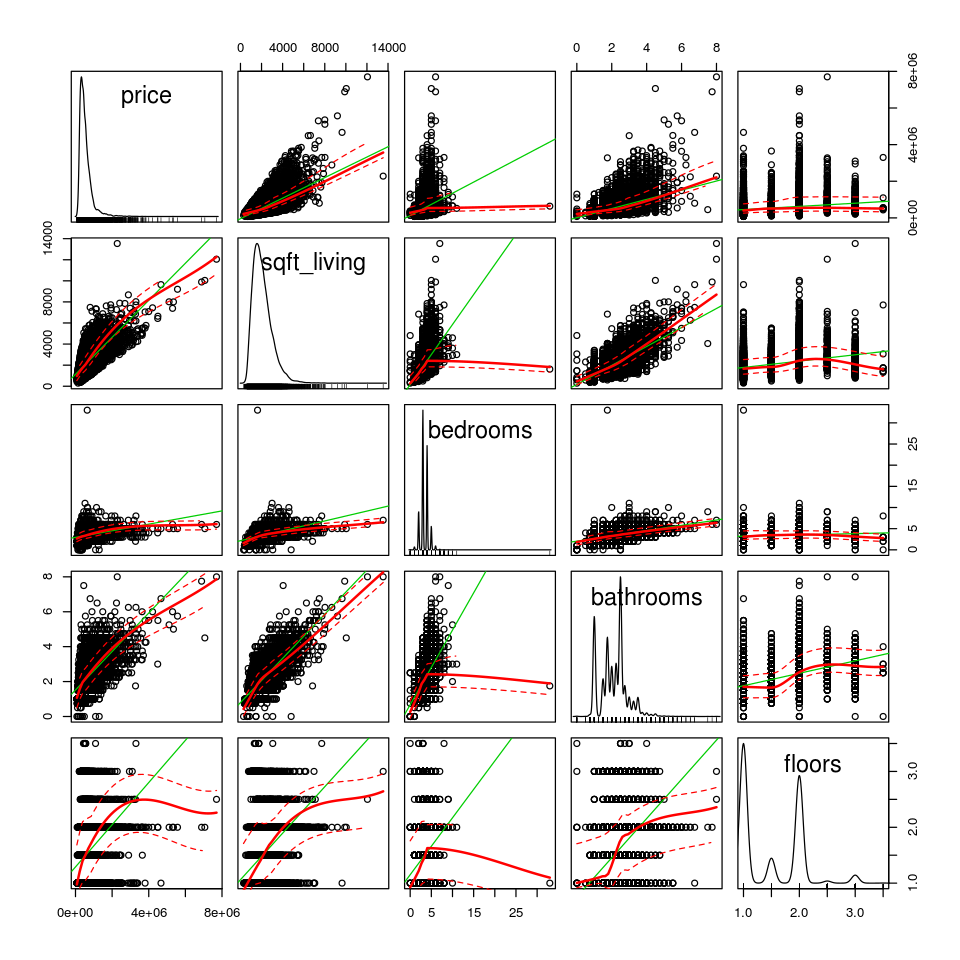

In [10]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  + sqft_living
                  + bedrooms 
                  + bathrooms 
                  + floors 
                  
                  , data = kc.housing)

Loading required package: corrplot
corrplot 0.84 loaded


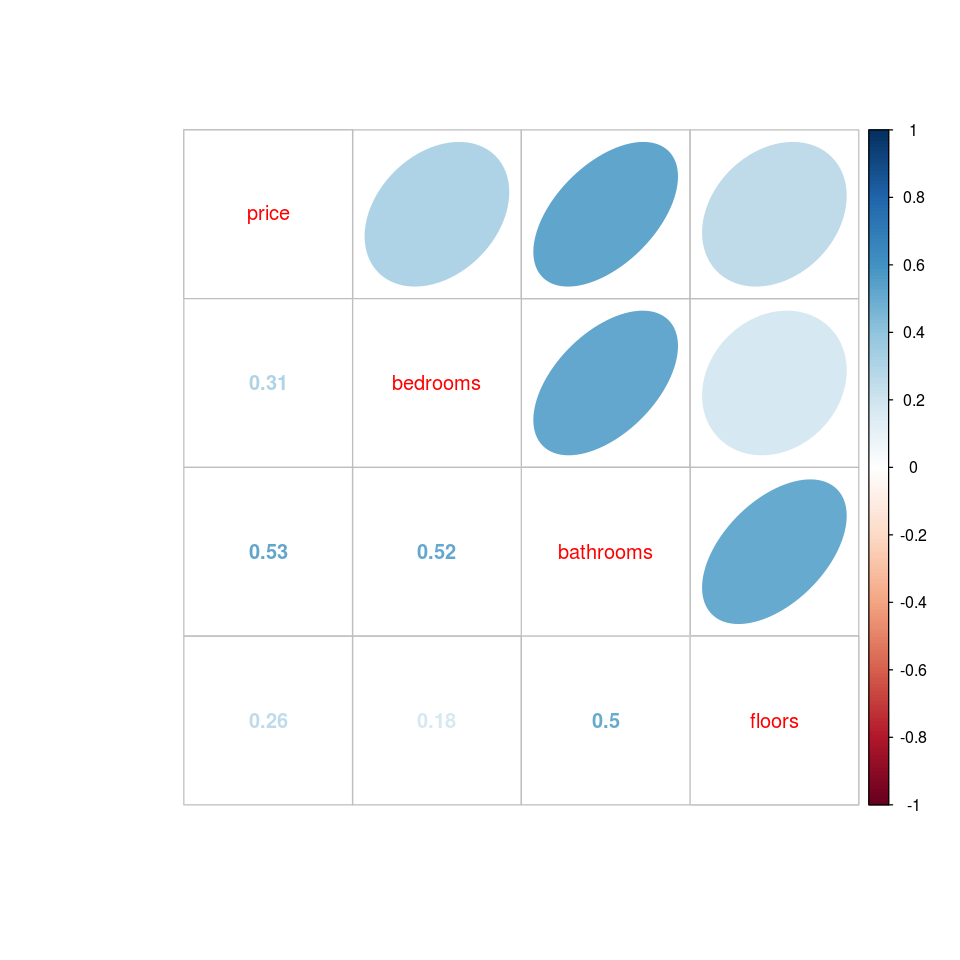

In [11]:
cols1 = c("price", "bedrooms", "bathrooms", "floors")
cors1 = cor(kc.housing[, cols1], method = 'pearson')
require (corrplot)
corrplot.mixed(cors1, upper = "ellipse")

Multiple categorical values, let's do some frequency "sweeps"

In [12]:
table(kc.housing$floors)


    1   1.5     2   2.5     3   3.5 
10680  1910  8241   161   613     8 

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

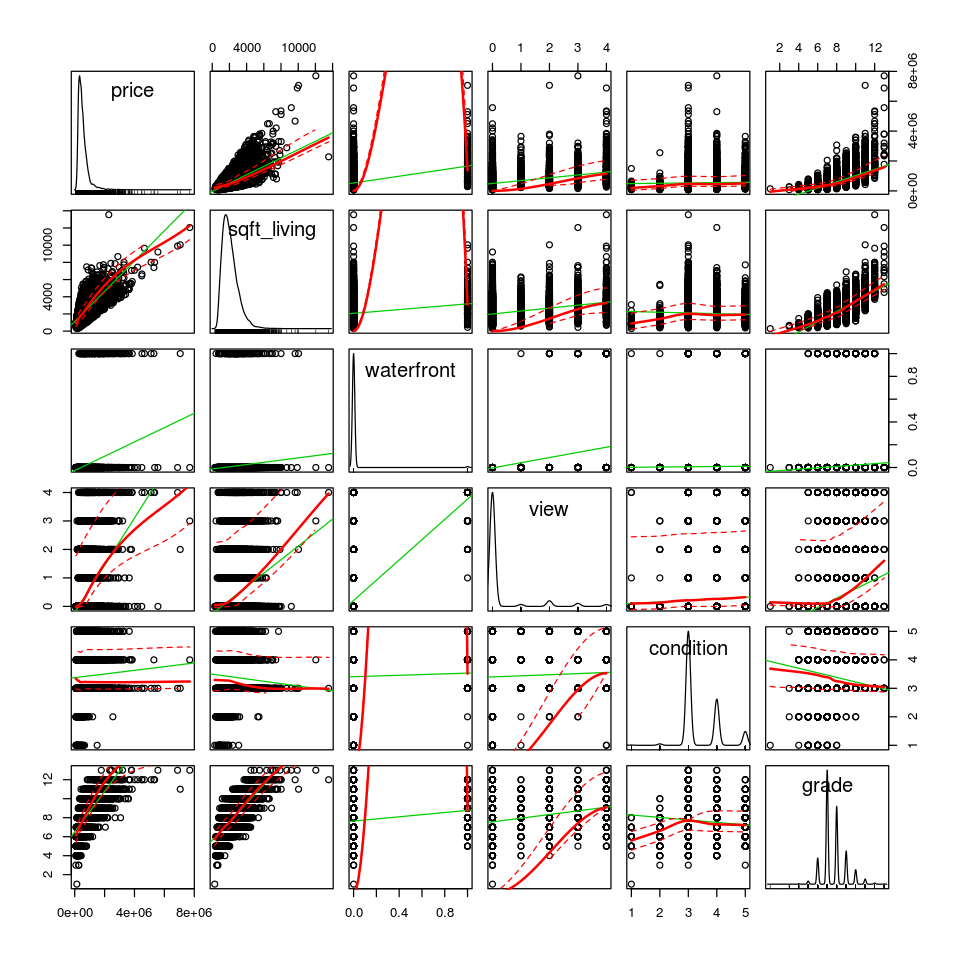

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living
                                    
                  + waterfront 
                  + view 
                  + condition 
                  + grade 
                  
                  , data = kc.housing)

In [14]:
table(kc.housing$grade)


   1    3    4    5    6    7    8    9   10   11   12   13 
   1    3   29  242 2038 8981 6068 2615 1134  399   90   13 

In [15]:
table(kc.housing$condition)


    1     2     3     4     5 
   30   172 14031  5679  1701 

In [16]:
table(kc.housing$view)


    0     1     2     3     4 
19489   332   963   510   319 

In [17]:
table(kc.housing$waterfront)


    0     1 
21450   163 

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

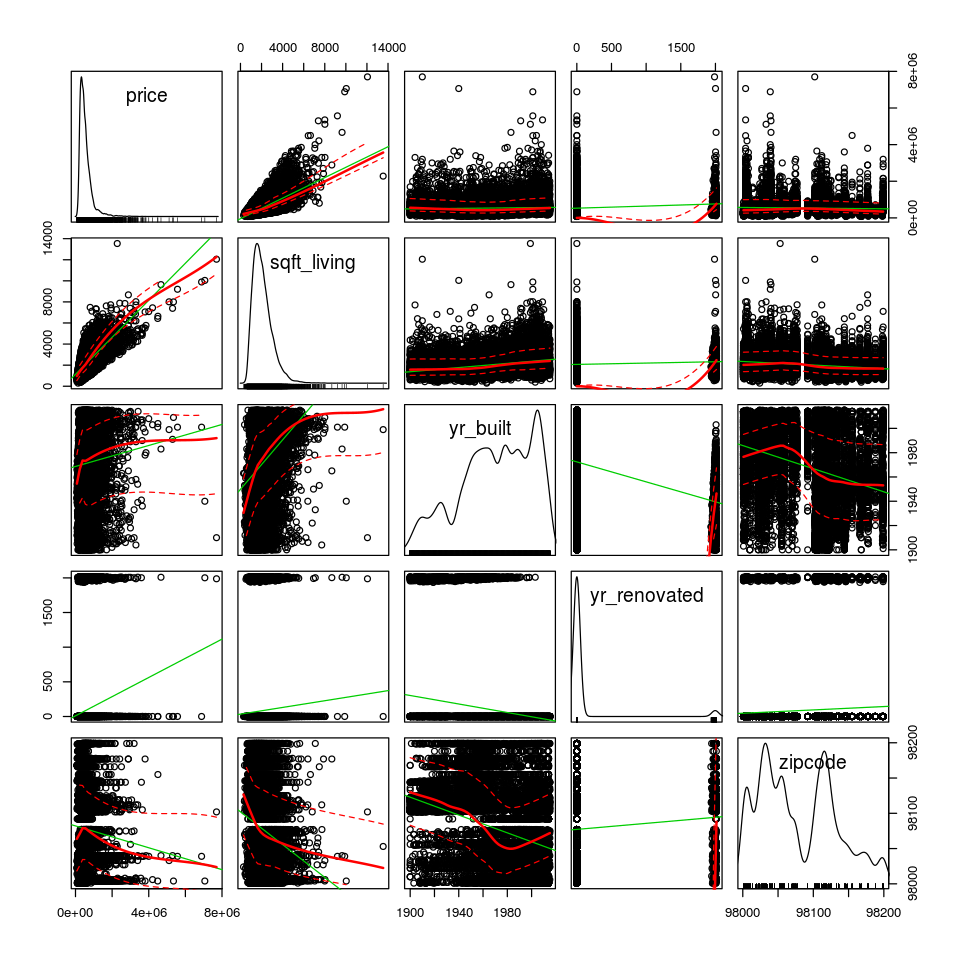

In [18]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living
                  
                  + yr_built 
                  + yr_renovated                   
                  + zipcode 
                  
                  , data = kc.housing)

In [19]:
table(kc.housing$yr_renovated)


    0  1934  1940  1944  1945  1946  1948  1950  1951  1953  1954  1955  1956 
20699     1     2     1     3     2     1     2     1     3     1     3     3 
 1957  1958  1959  1960  1962  1963  1964  1965  1967  1968  1969  1970  1971 
    3     5     1     4     2     4     5     5     2     8     4     9     2 
 1972  1973  1974  1975  1976  1977  1978  1979  1980  1981  1982  1983  1984 
    4     5     3     6     3     8     6    10    11     5    11    18    18 
 1985  1986  1987  1988  1989  1990  1991  1992  1993  1994  1995  1996  1997 
   17    17    18    15    22    25    20    17    19    19    16    15    15 
 1998  1999  2000  2001  2002  2003  2004  2005  2006  2007  2008  2009  2010 
   19    17    35    19    22    36    26    35    24    35    18    22    18 
 2011  2012  2013  2014  2015 
   13    11    37    91    16 

In [20]:
table(kc.housing$zipcode)


98001 98002 98003 98004 98005 98006 98007 98008 98010 98011 98014 98019 98022 
  362   199   280   317   168   498   141   283   100   195   124   190   234 
98023 98024 98027 98028 98029 98030 98031 98032 98033 98034 98038 98039 98040 
  499    81   412   283   321   256   274   125   432   545   590    50   282 
98042 98045 98052 98053 98055 98056 98058 98059 98065 98070 98072 98074 98075 
  548   221   574   405   268   406   455   468   310   118   273   441   359 
98077 98092 98102 98103 98105 98106 98107 98108 98109 98112 98115 98116 98117 
  198   351   105   602   229   335   266   186   109   269   583   330   553 
98118 98119 98122 98125 98126 98133 98136 98144 98146 98148 98155 98166 98168 
  508   184   290   410   354   494   263   343   288    57   446   254   269 
98177 98178 98188 98198 98199 
  255   262   136   280   317 

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

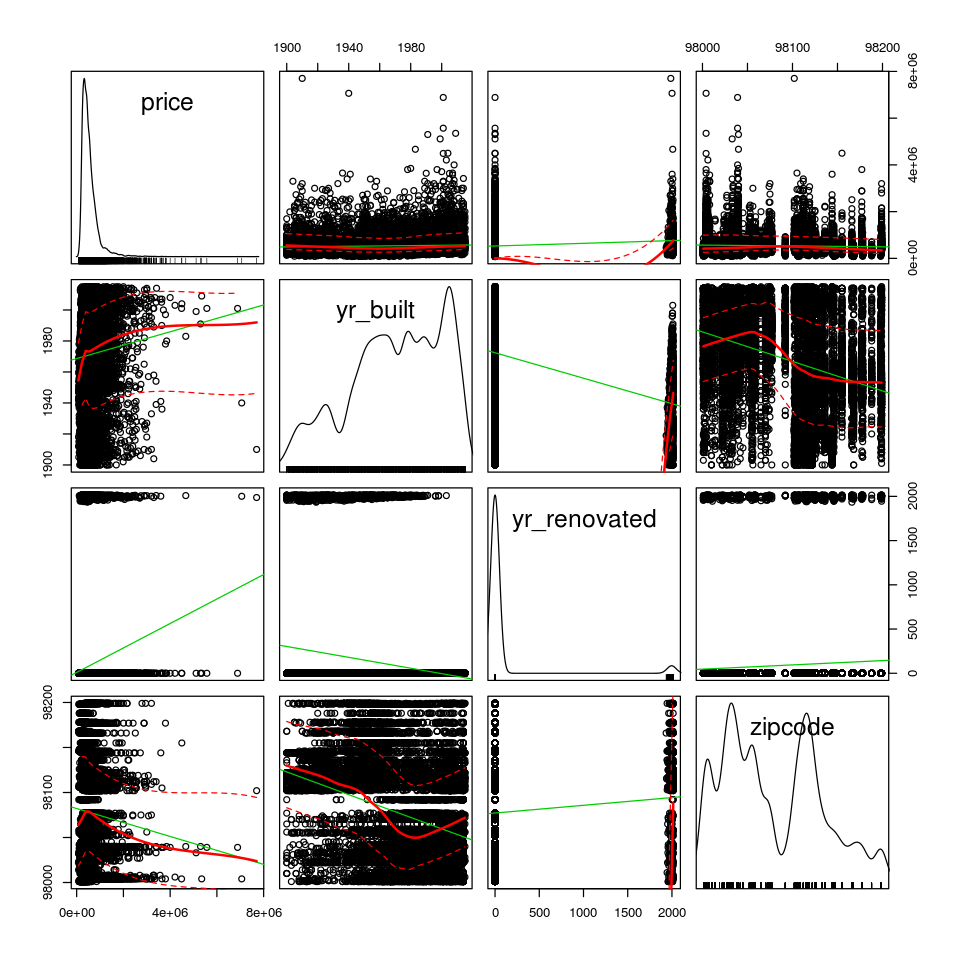

In [21]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + yr_built 
                  + yr_renovated                   
                  + zipcode 
                  
                  , data = kc.housing)

### Deep Dive into yr_renovated

Loading required package: ggplot2
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


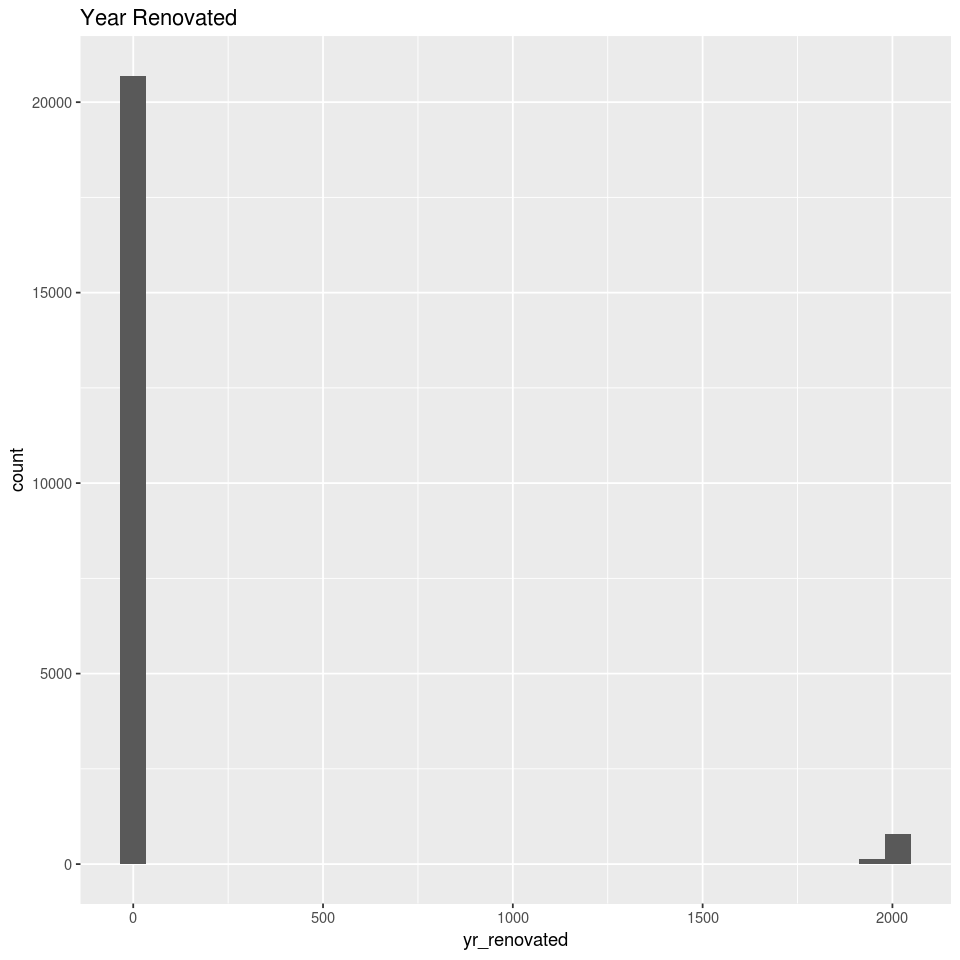

In [22]:
require(ggplot2)
ggplot(kc.housing, aes(yr_renovated)) + ## Specify the data frame and columns. Note the + chain operator
     geom_histogram() + ## Fuction for the plot type 
     ggtitle('Year Renovated')

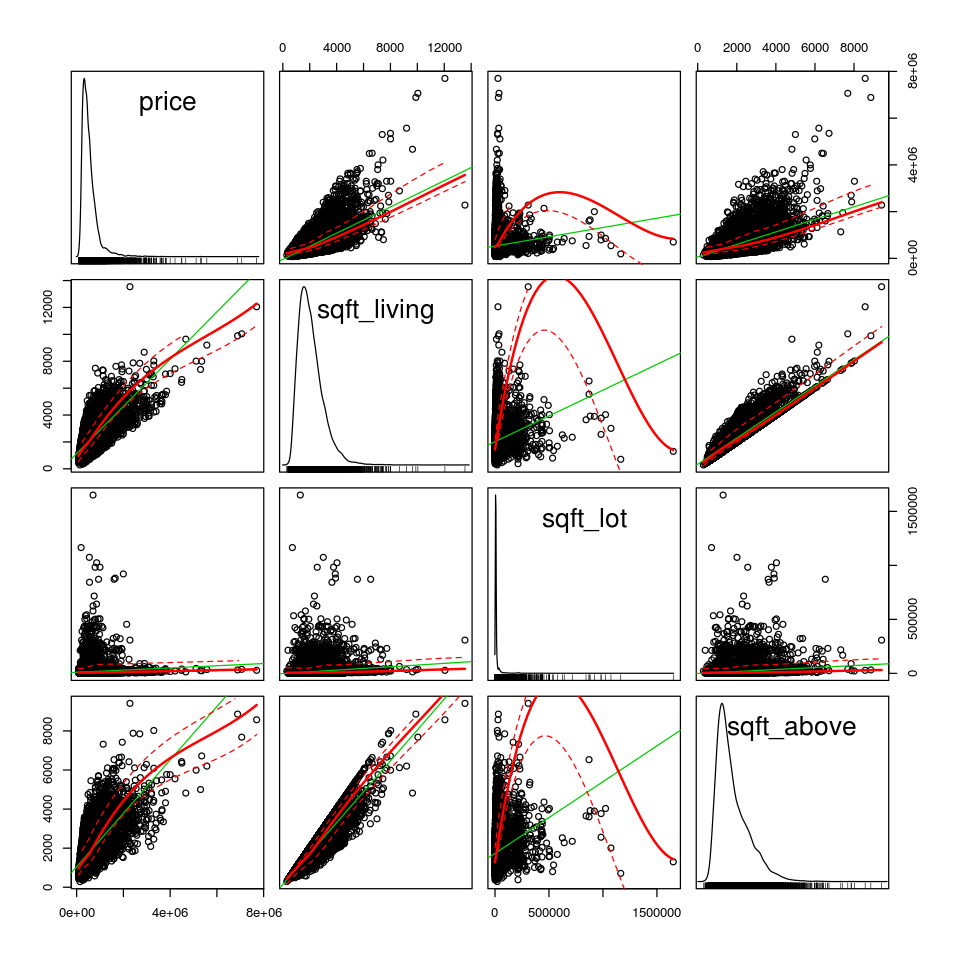

In [23]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                  
                  + sqft_living 
                  + sqft_lot 
                  + sqft_above 
                  
                  , data = kc.housing)

In [24]:
table(kc.housing$zipcode)


98001 98002 98003 98004 98005 98006 98007 98008 98010 98011 98014 98019 98022 
  362   199   280   317   168   498   141   283   100   195   124   190   234 
98023 98024 98027 98028 98029 98030 98031 98032 98033 98034 98038 98039 98040 
  499    81   412   283   321   256   274   125   432   545   590    50   282 
98042 98045 98052 98053 98055 98056 98058 98059 98065 98070 98072 98074 98075 
  548   221   574   405   268   406   455   468   310   118   273   441   359 
98077 98092 98102 98103 98105 98106 98107 98108 98109 98112 98115 98116 98117 
  198   351   105   602   229   335   266   186   109   269   583   330   553 
98118 98119 98122 98125 98126 98133 98136 98144 98146 98148 98155 98166 98168 
  508   184   290   410   354   494   263   343   288    57   446   254   269 
98177 98178 98188 98198 98199 
  255   262   136   280   317 

# Color by Floors

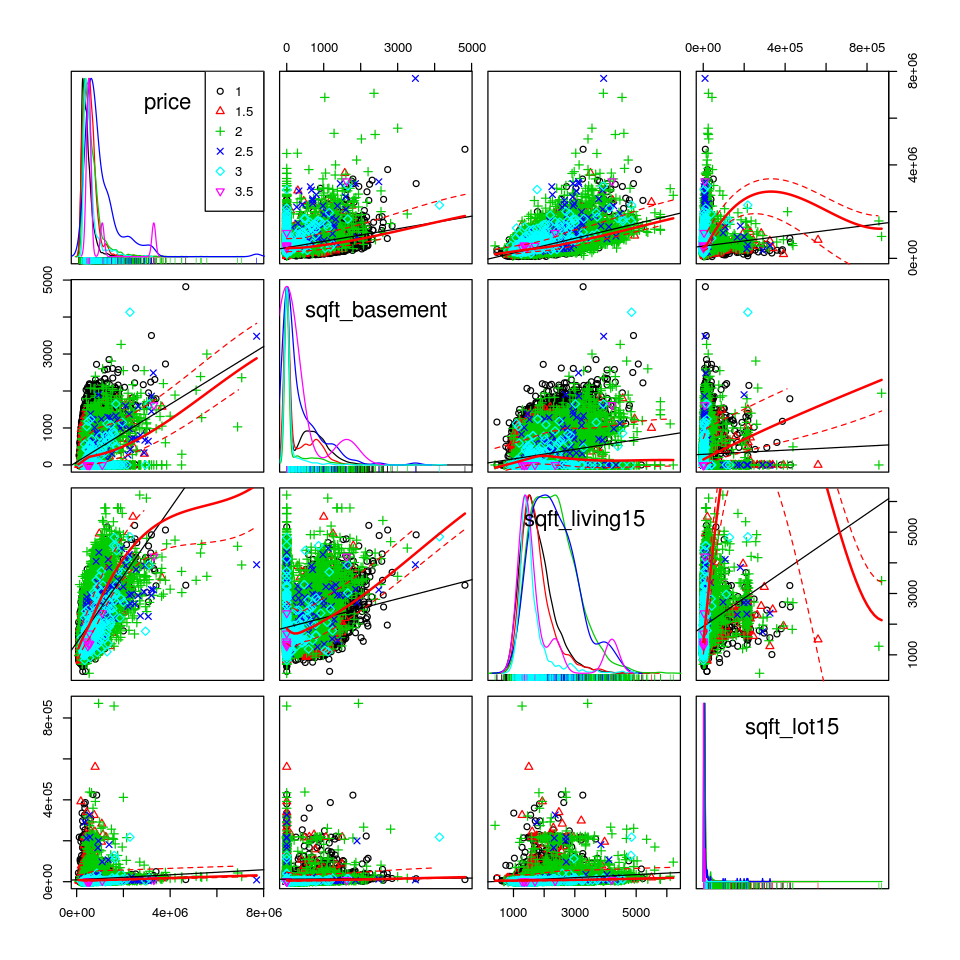

In [25]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                   
                  + sqft_basement 
                  + sqft_living15 
                  + sqft_lot15
                  | factor(floors)
                  
                  , data = kc.housing)

## Save money by going tall (above)
* floors: 3-story houses cluster toward the lower-left ..
  * wether it's basement, living15, or lot15, the smaller/chaper houses are 3-story.
  * in all the same cases, the outliners (big & expensve) are 2-story.

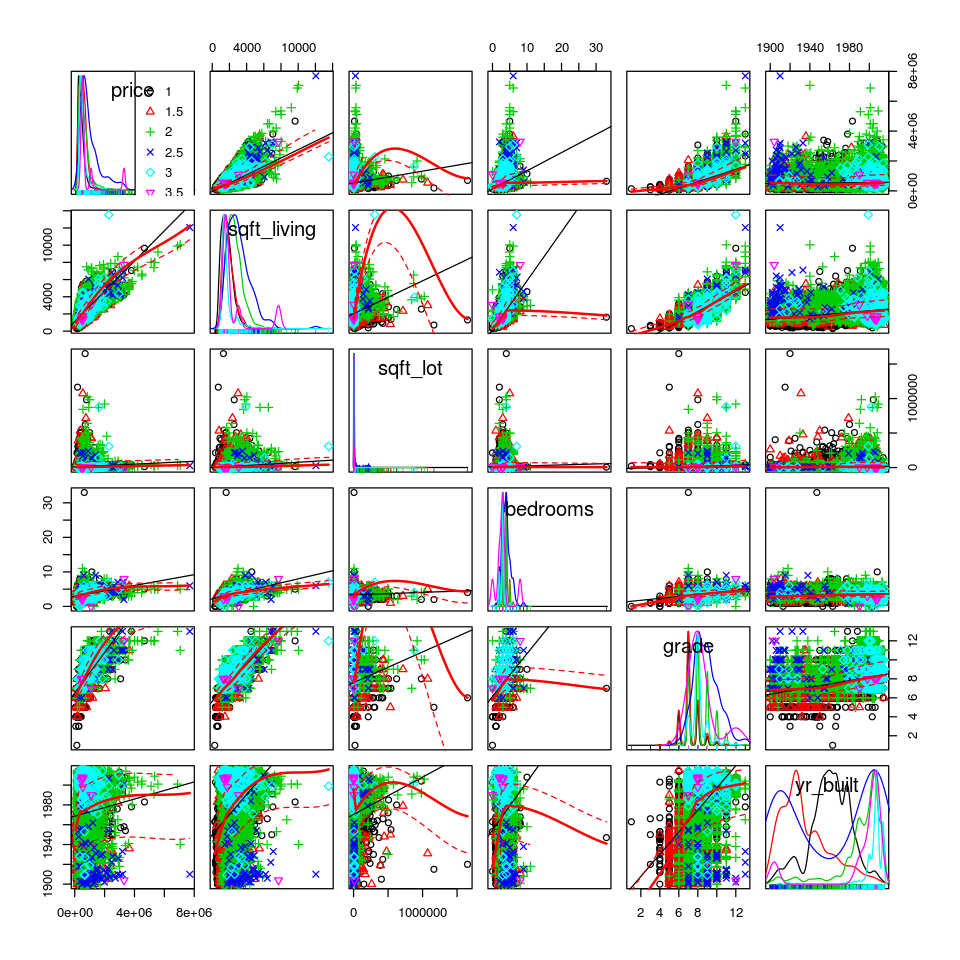

In [26]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | factor(floors)
                  , data = kc.housing)

Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”Warning message in smoother(x, y, col = col[2], log.x = FALSE, log.y = FALSE, spread = spread, :
“could not fit smooth”

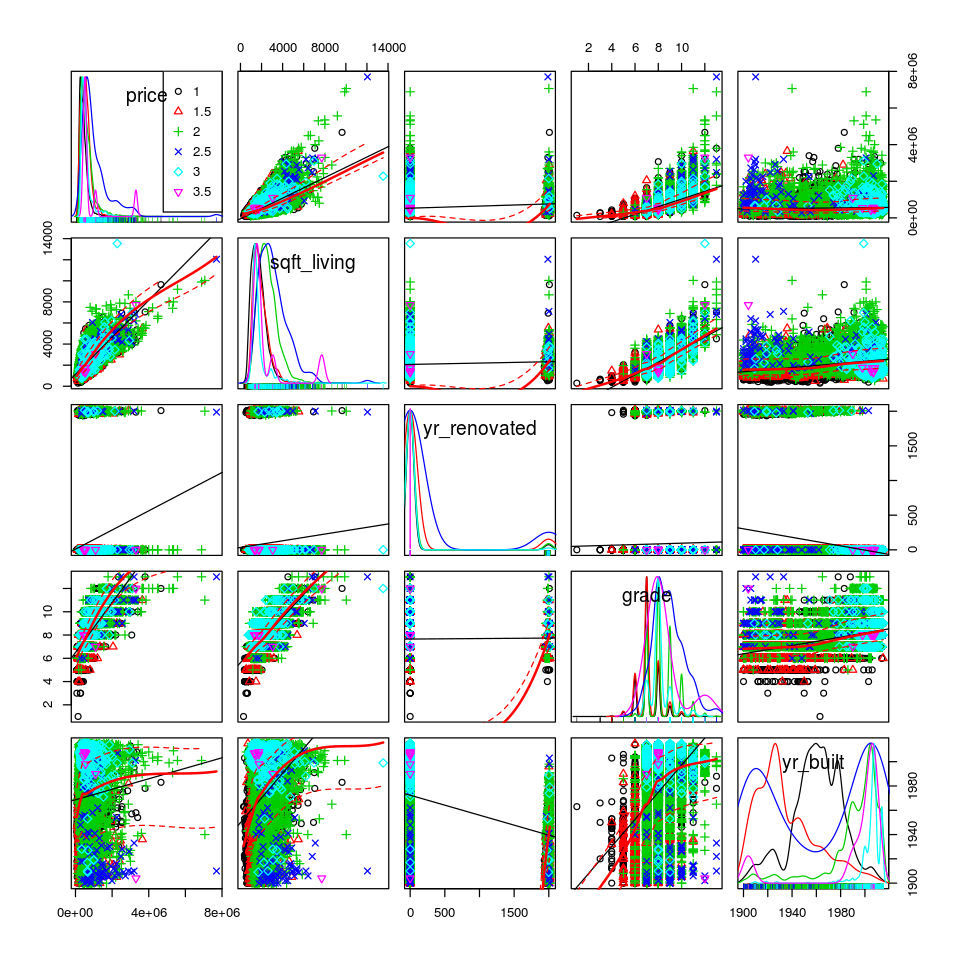

In [27]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living  
                  + yr_renovated + grade + yr_built
                  | factor(floors)
                  , data = kc.housing)

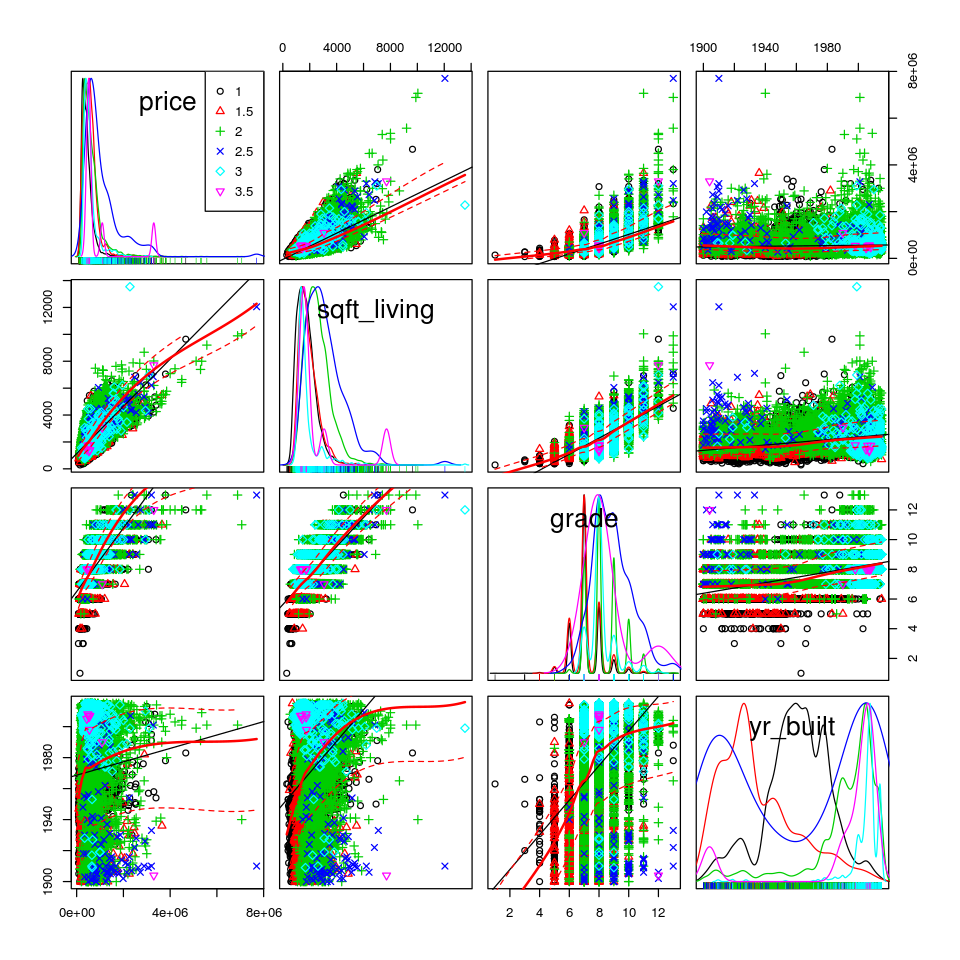

In [28]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living  + grade + yr_built
                  | factor(floors), data = kc.housing)

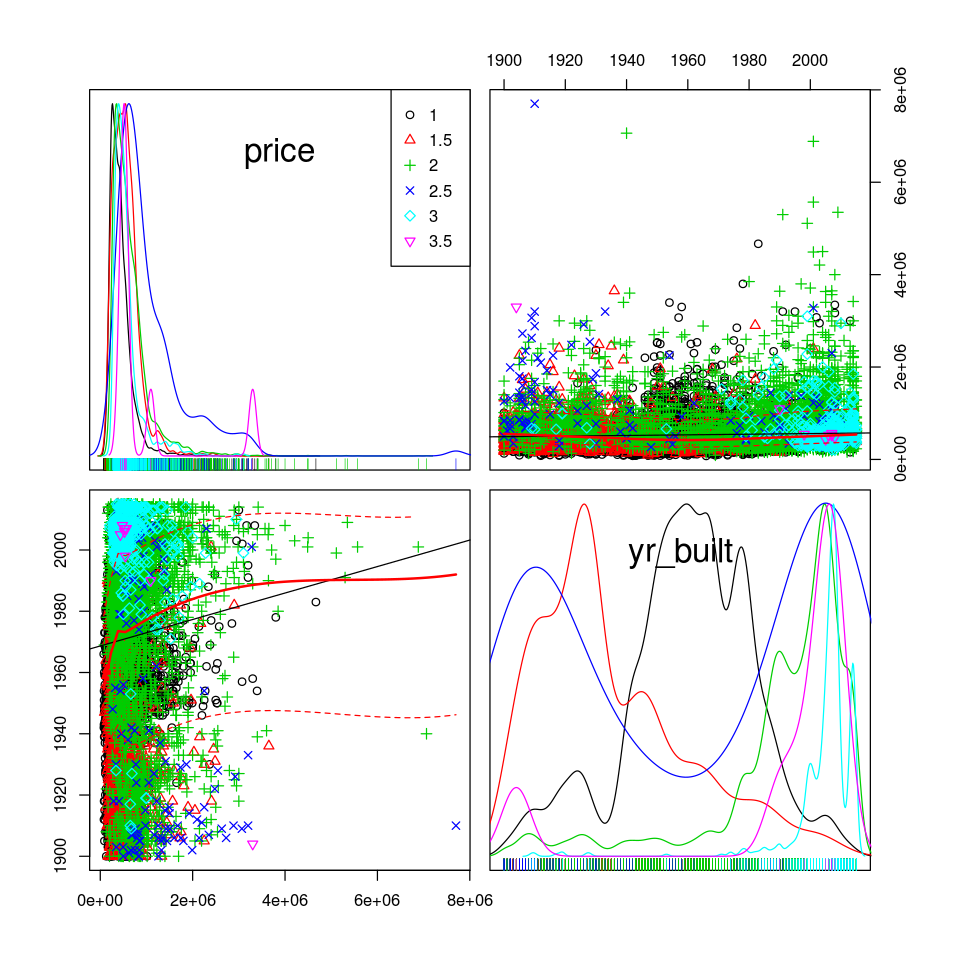

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + yr_built
                  | factor(floors), data = kc.housing)

# Color by Year Renovated

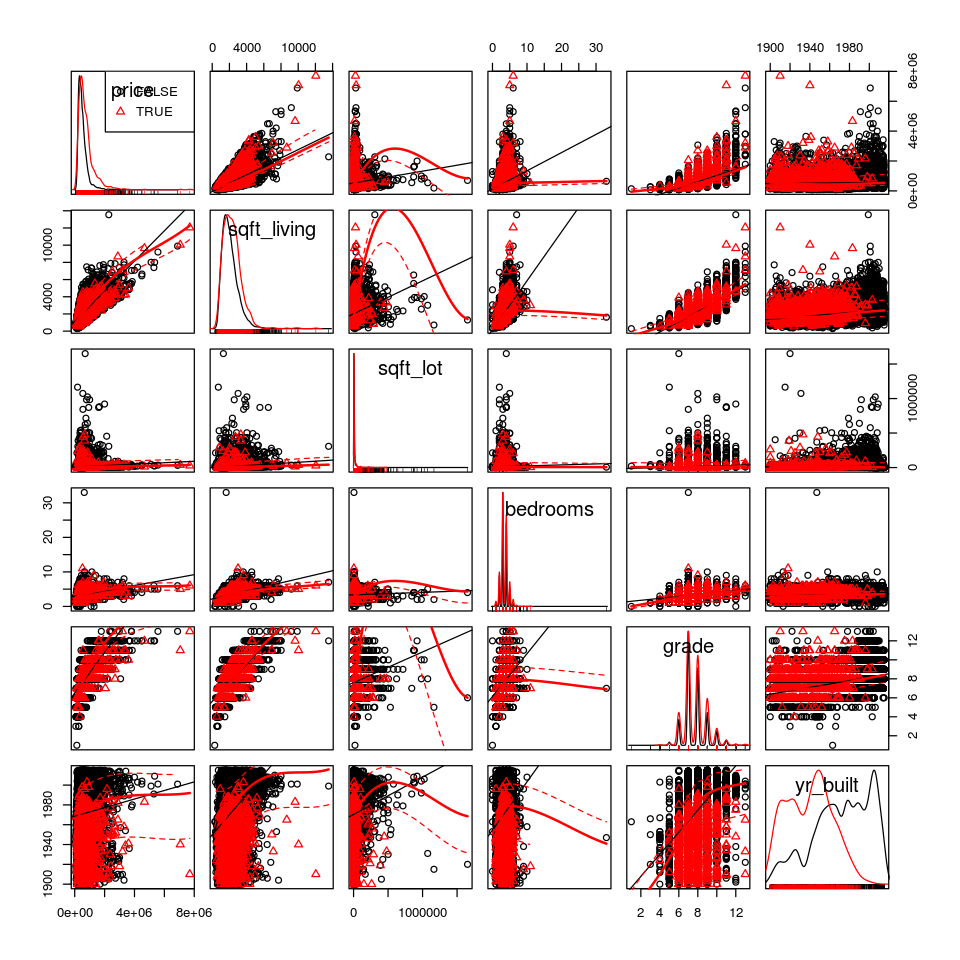

In [48]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | factor(yr_renovated > 0)
                  
                  , data = kc.housing)

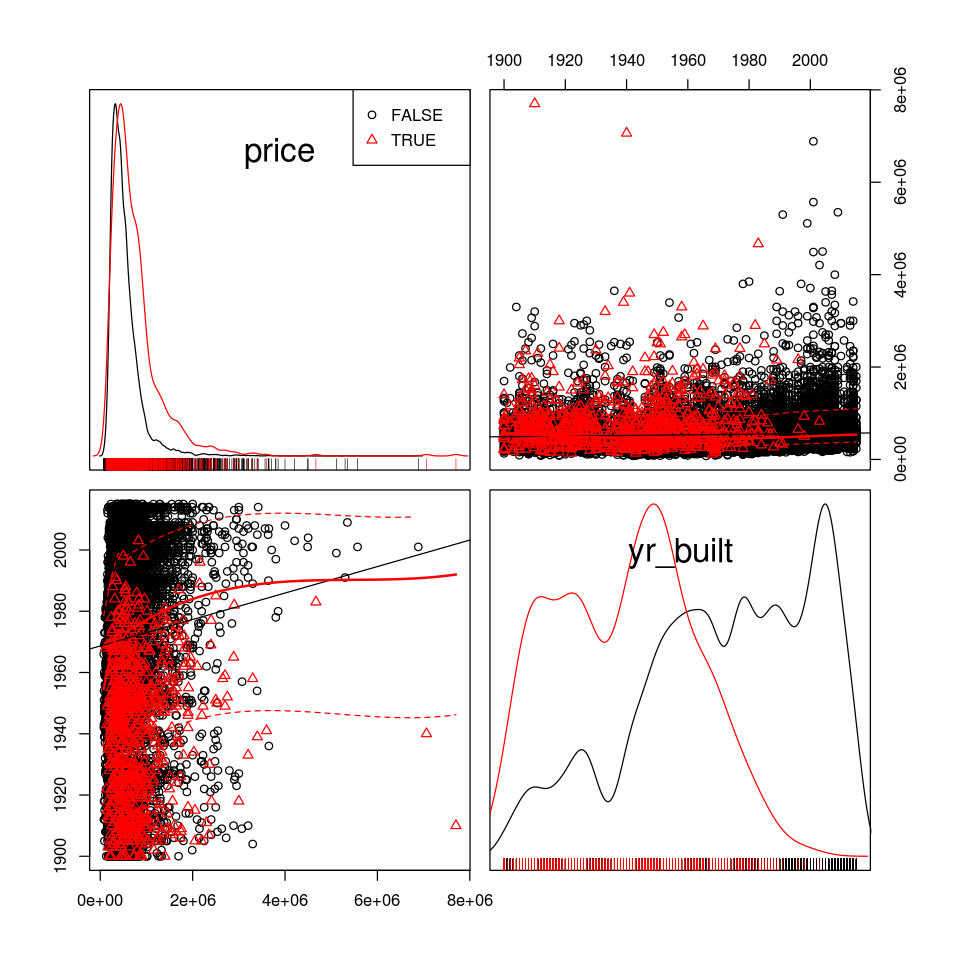

In [31]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + yr_built
                  | factor(yr_renovated > 0)
                  
                  , data = kc.housing)

In [32]:
table(kc.housing$yr_renovated)


    0  1934  1940  1944  1945  1946  1948  1950  1951  1953  1954  1955  1956 
20699     1     2     1     3     2     1     2     1     3     1     3     3 
 1957  1958  1959  1960  1962  1963  1964  1965  1967  1968  1969  1970  1971 
    3     5     1     4     2     4     5     5     2     8     4     9     2 
 1972  1973  1974  1975  1976  1977  1978  1979  1980  1981  1982  1983  1984 
    4     5     3     6     3     8     6    10    11     5    11    18    18 
 1985  1986  1987  1988  1989  1990  1991  1992  1993  1994  1995  1996  1997 
   17    17    18    15    22    25    20    17    19    19    16    15    15 
 1998  1999  2000  2001  2002  2003  2004  2005  2006  2007  2008  2009  2010 
   19    17    35    19    22    36    26    35    24    35    18    22    18 
 2011  2012  2013  2014  2015 
   13    11    37    91    16 

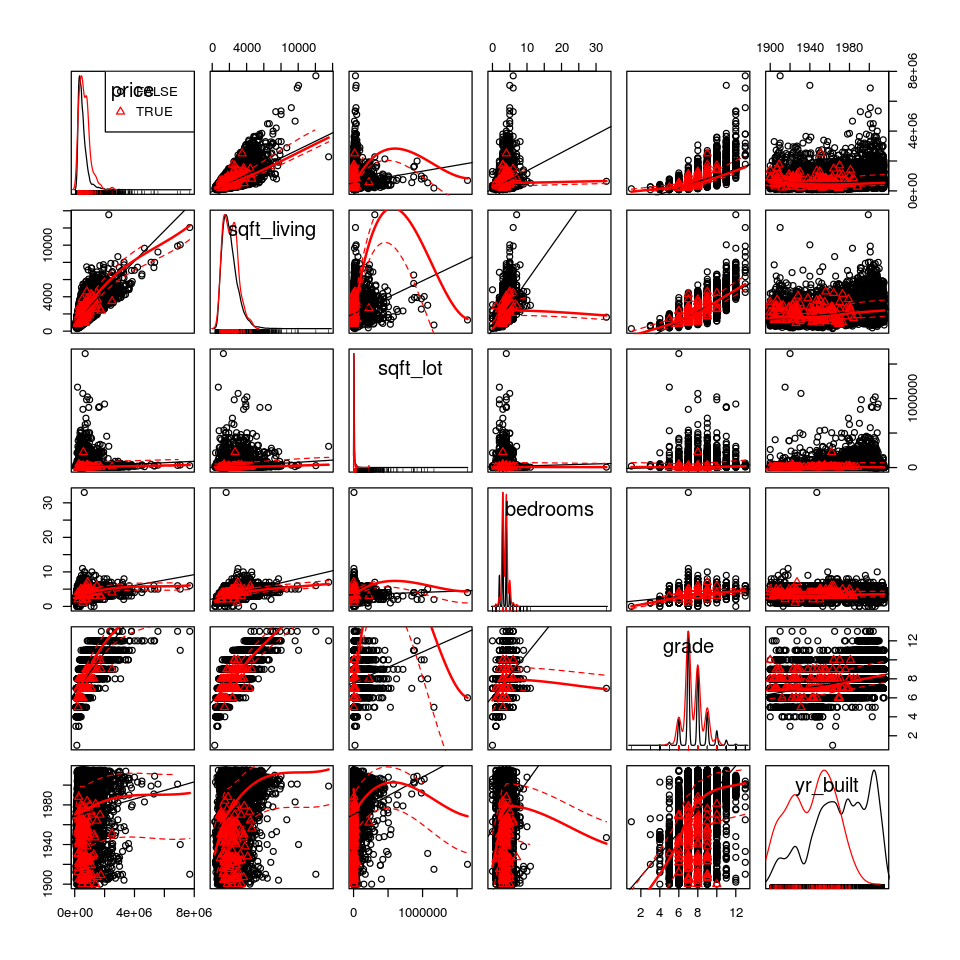

In [49]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | factor(yr_renovated > 2012)
                  
                  , data = kc.housing)

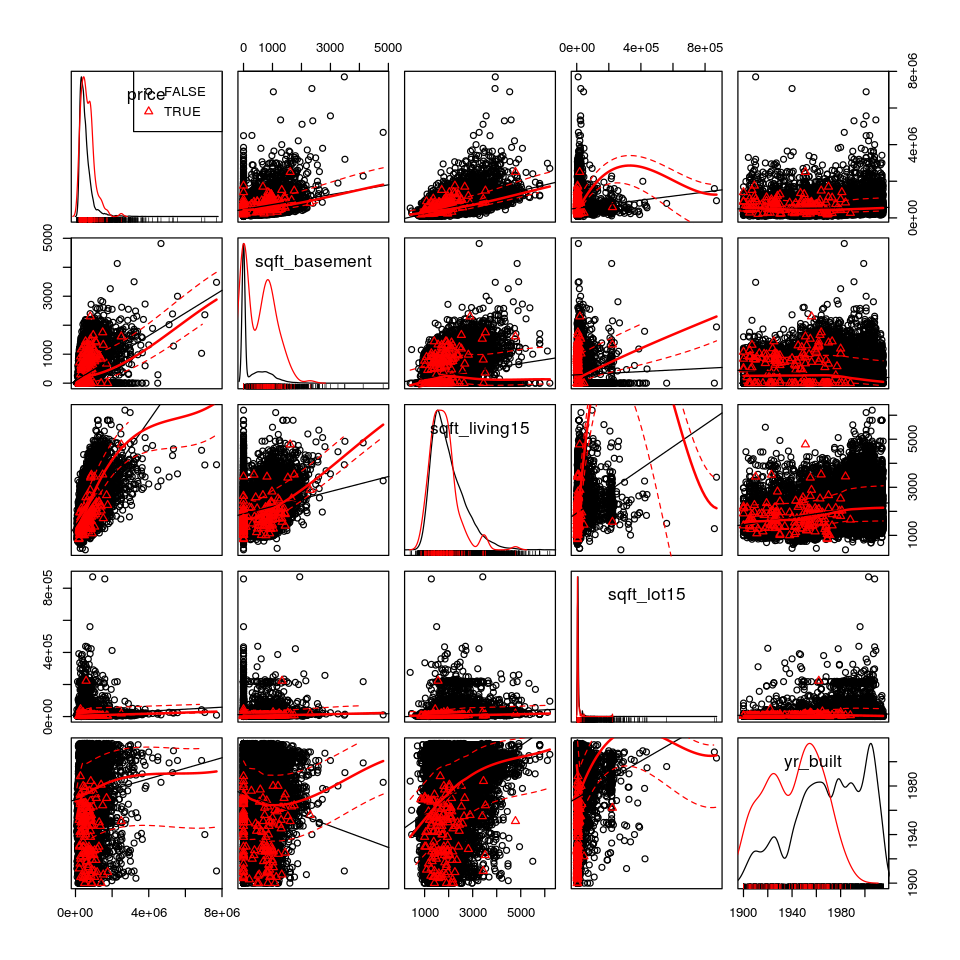

In [33]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price 
                   
                  + sqft_basement 
                  + sqft_living15 
                  + sqft_lot15
                  + yr_built
                  | factor(yr_renovated > 2012)
                  
                  , data = kc.housing)

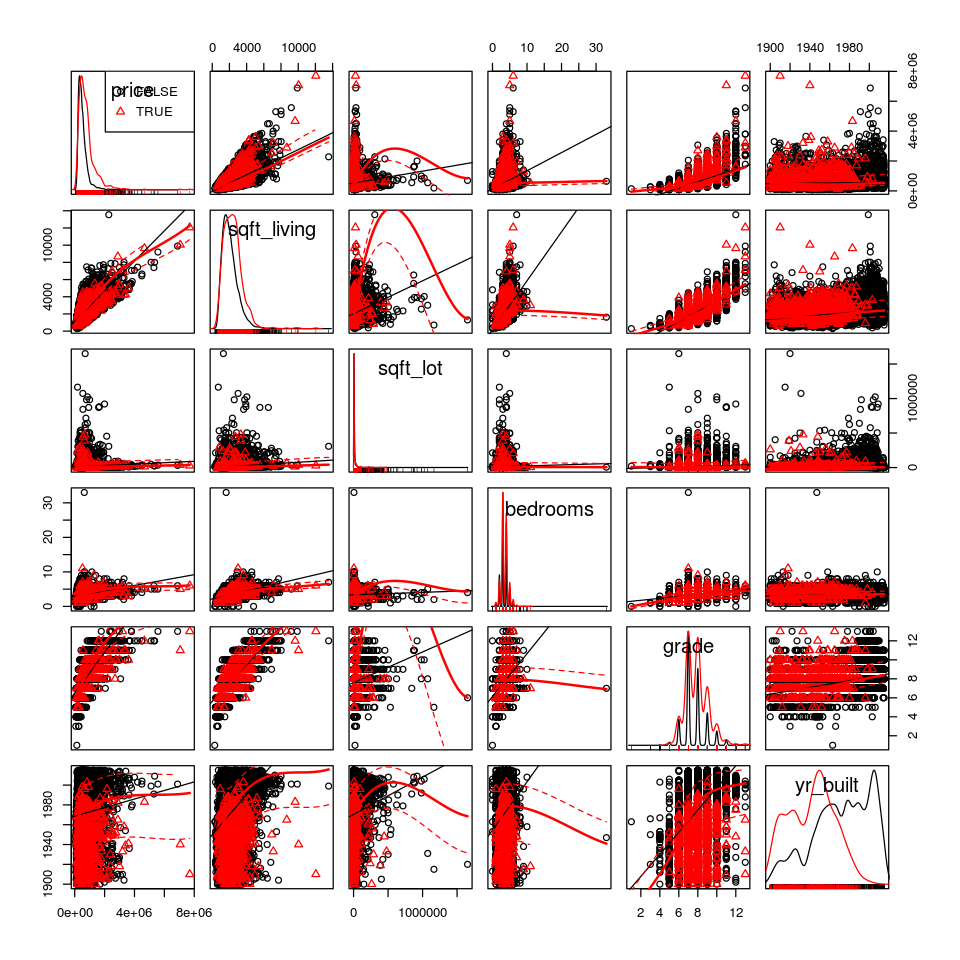

In [50]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built

                  | factor(yr_renovated > 1980)
                  
                  , data = kc.housing)

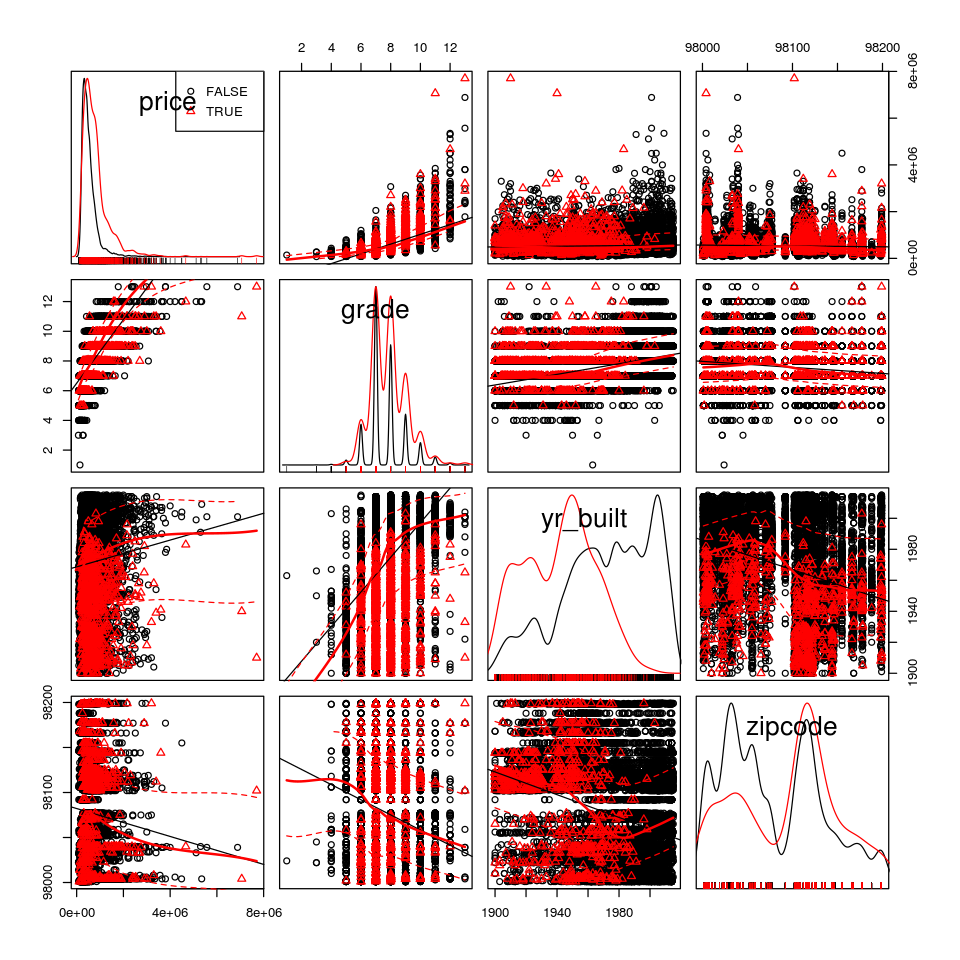

In [34]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + grade
                  + yr_built + zipcode

                  | factor(yr_renovated > 1980)
                  
                  , data = kc.housing)

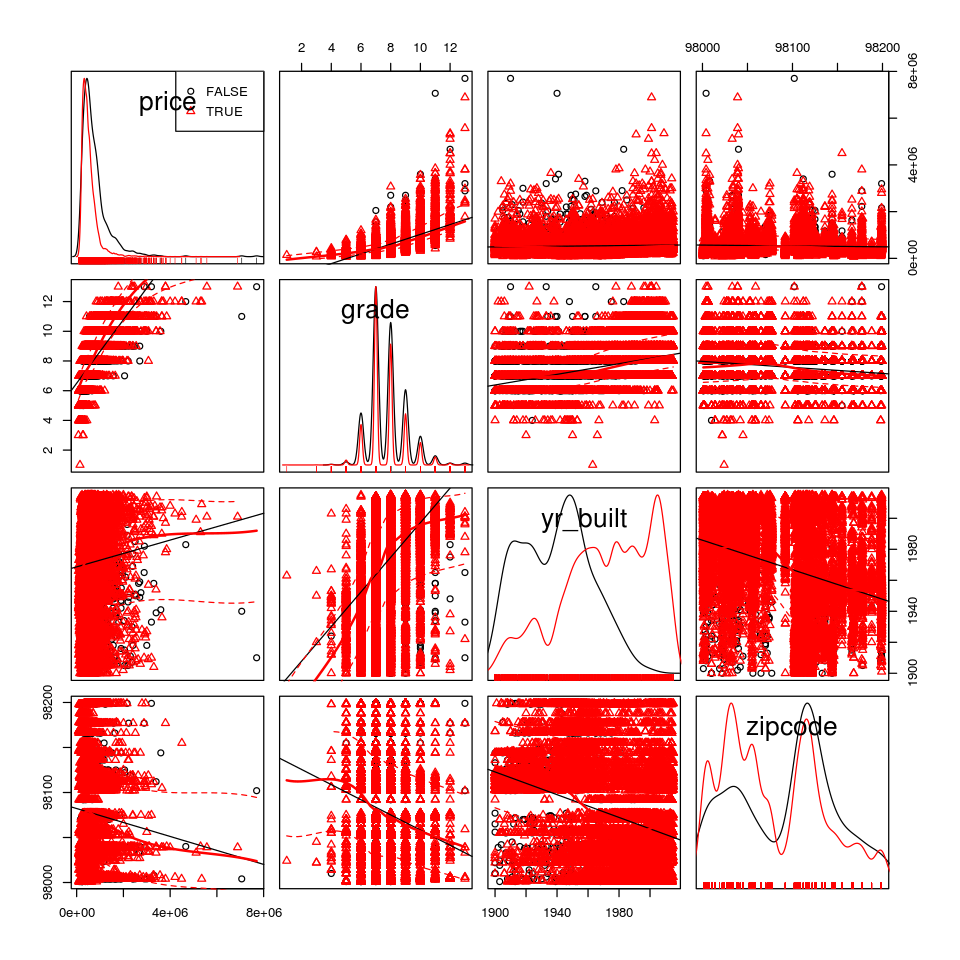

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + grade
                  + yr_built + zipcode

                  | factor(yr_renovated < 1 | yr_renovated > 2013)
                  
                  , data = kc.housing)

## Color by floors

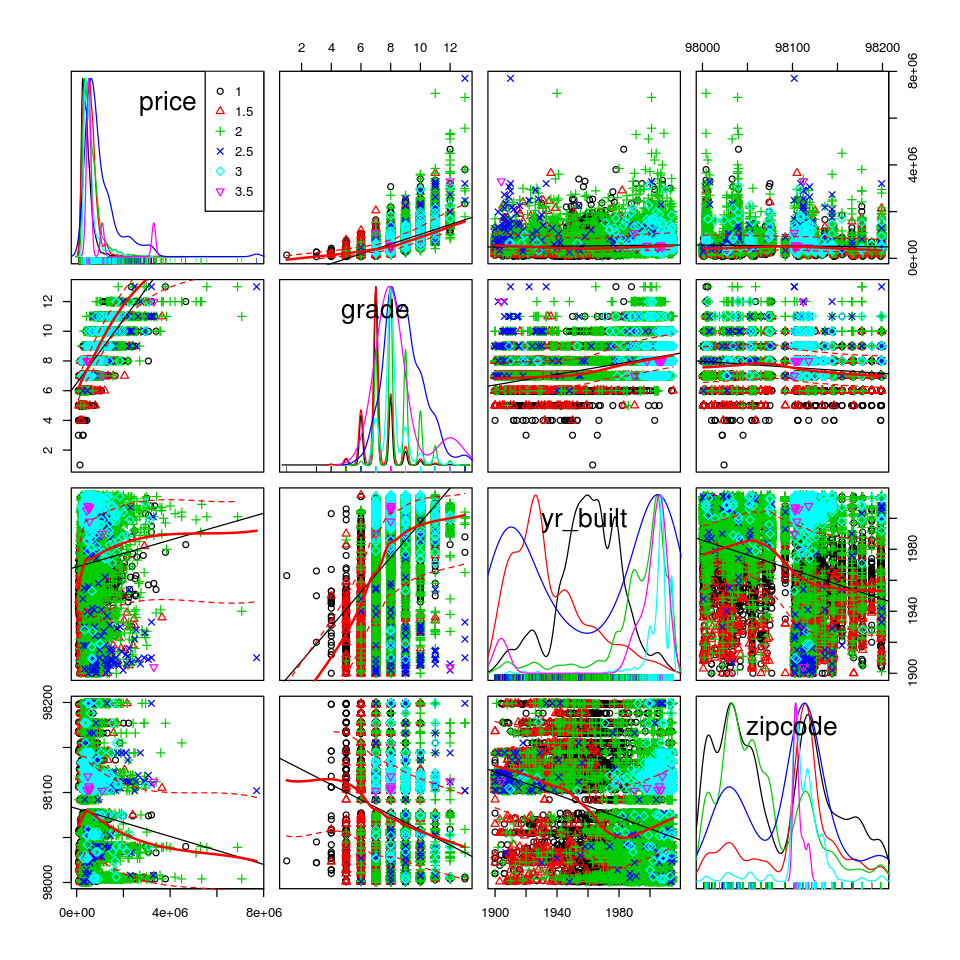

In [36]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + grade
                  + yr_built + zipcode
                  | factor(floors)
                  
                  , data = kc.housing)

## Color by Waterfront

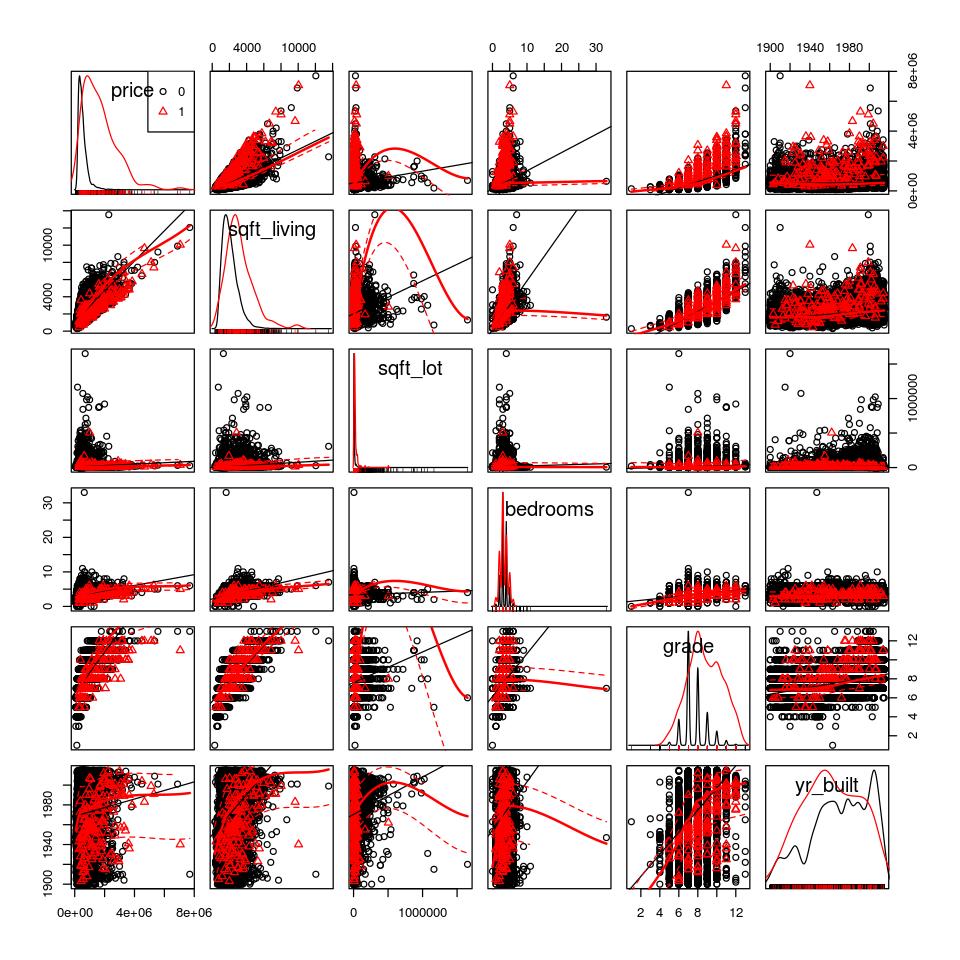

In [51]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | factor(waterfront)
                  
                  , data = kc.housing)

## Color by View

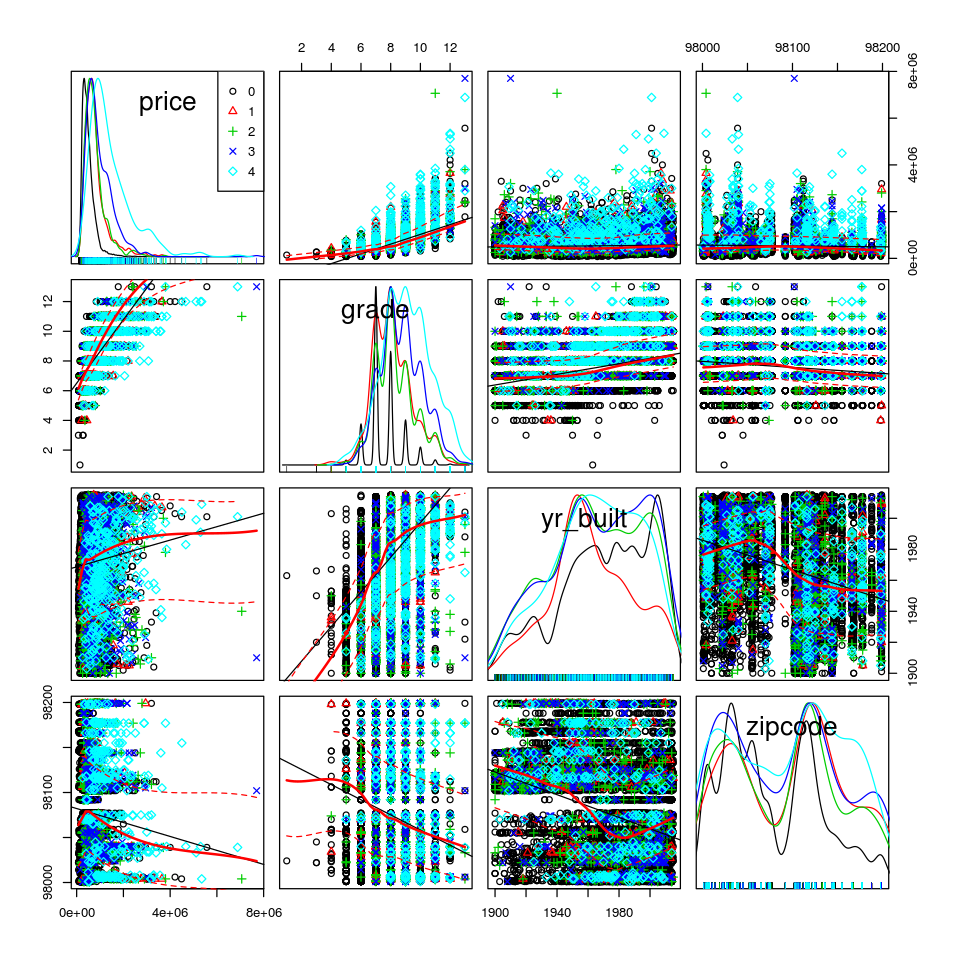

In [38]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + grade
                  + yr_built + zipcode
                  | factor(view)
                  
                  , data = kc.housing)

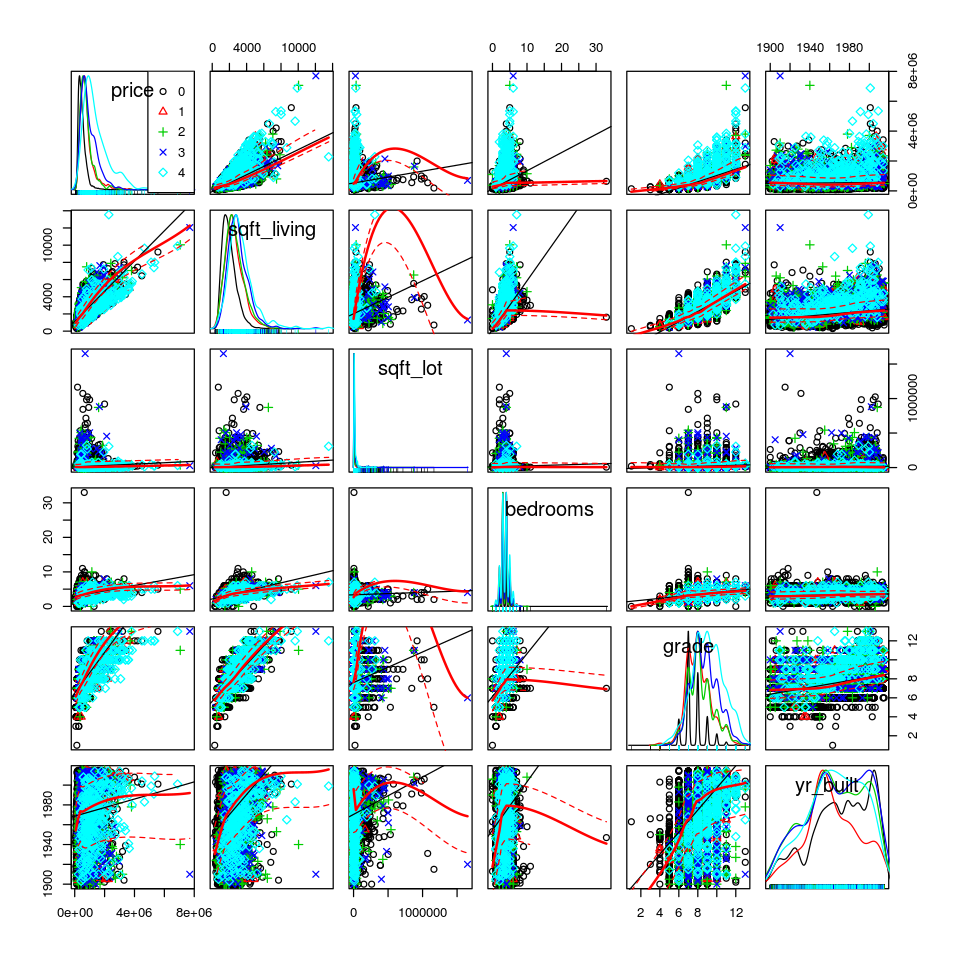

In [52]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | factor(view)
                  
                  , data = kc.housing)

## Color by condition

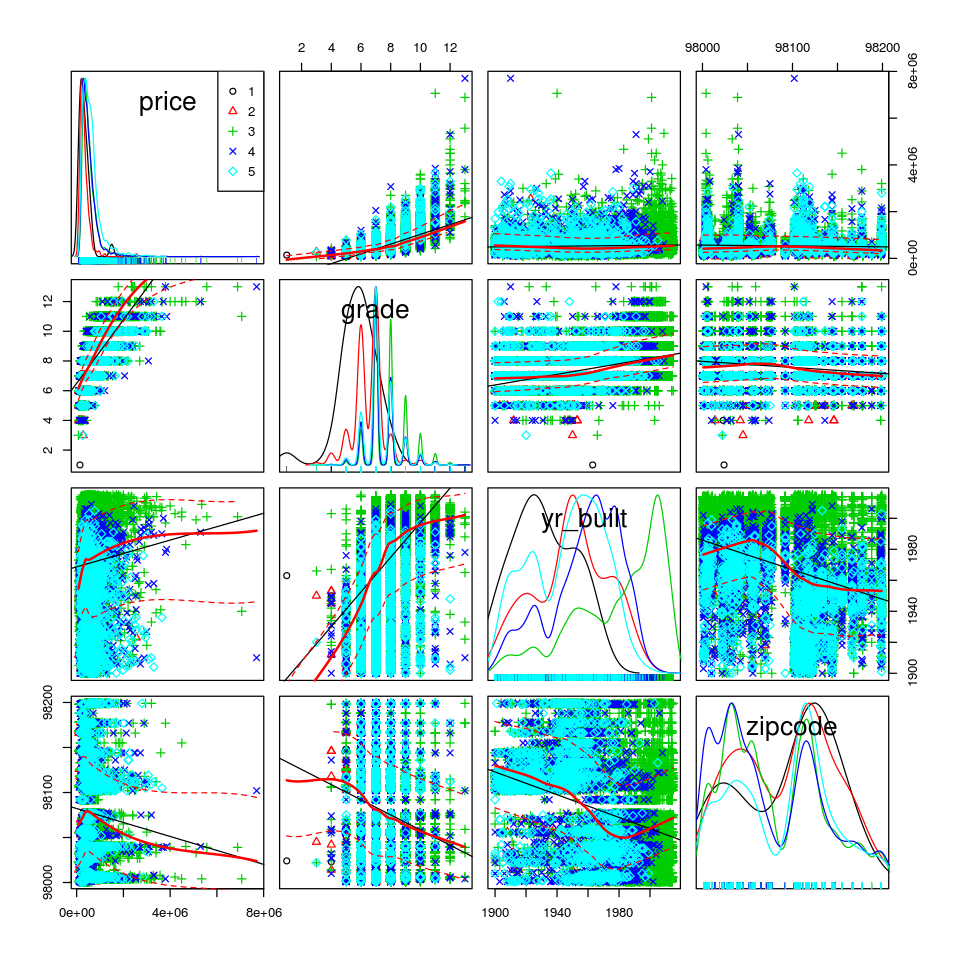

In [39]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + grade
                  + yr_built + zipcode
                  | factor(condition)
                  
                  , data = kc.housing)

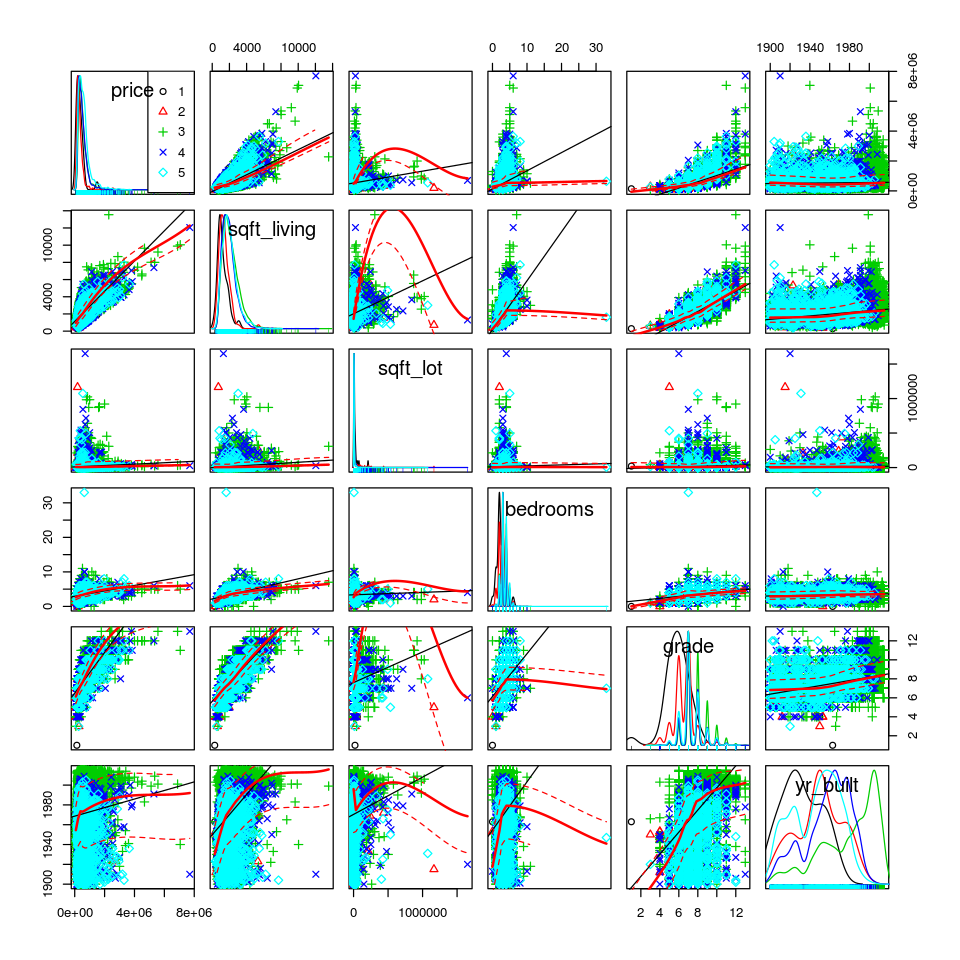

In [53]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | factor(condition)
                  
                  , data = kc.housing)

## Color by grade

Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimpl

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '26'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '27'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '28'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '29'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '30'”Warning message in plot.xy(xy.coords(x, 

“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, y), type = type, ...):
“unimplemented pch value '31'”Warning message in plot.xy(xy.coords(x, 

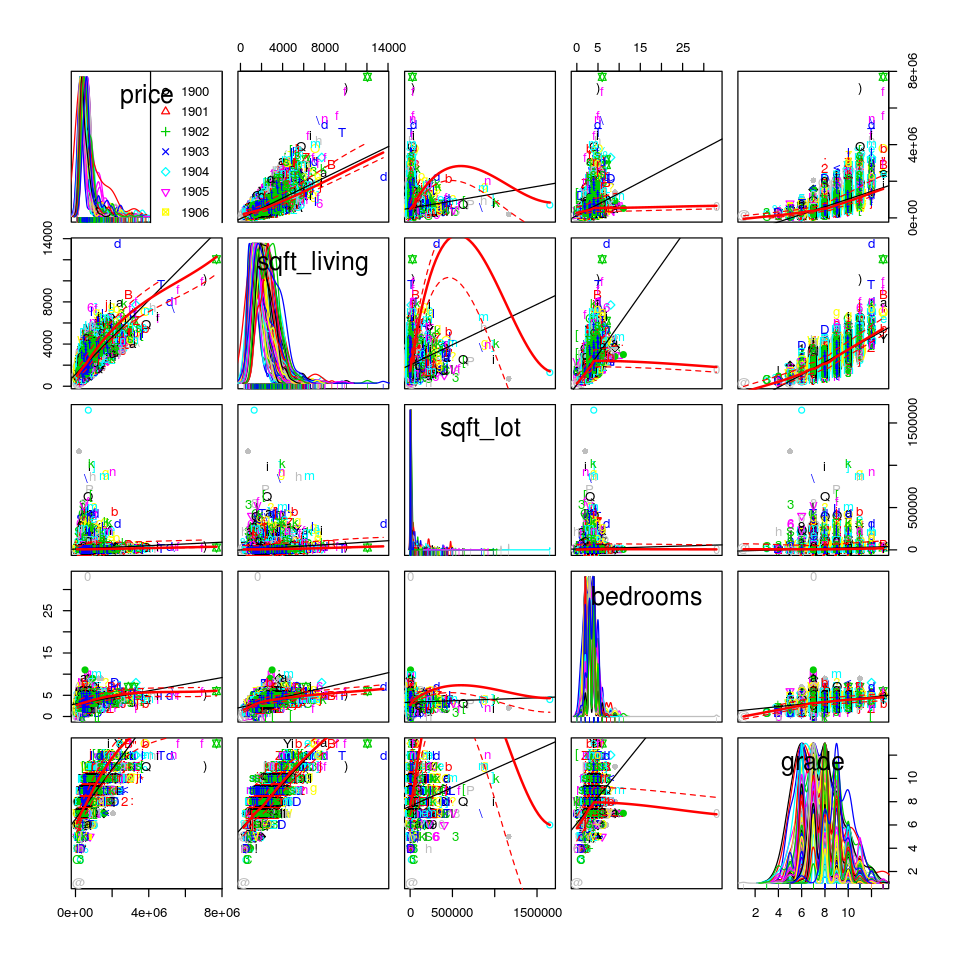

In [55]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living + sqft_lot 
                  + bedrooms + grade + yr_built
                  | grade 
                  
                  , data = kc.housing)

Warning message in diag.panel(...):
“cannot estimate density for group 1
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”

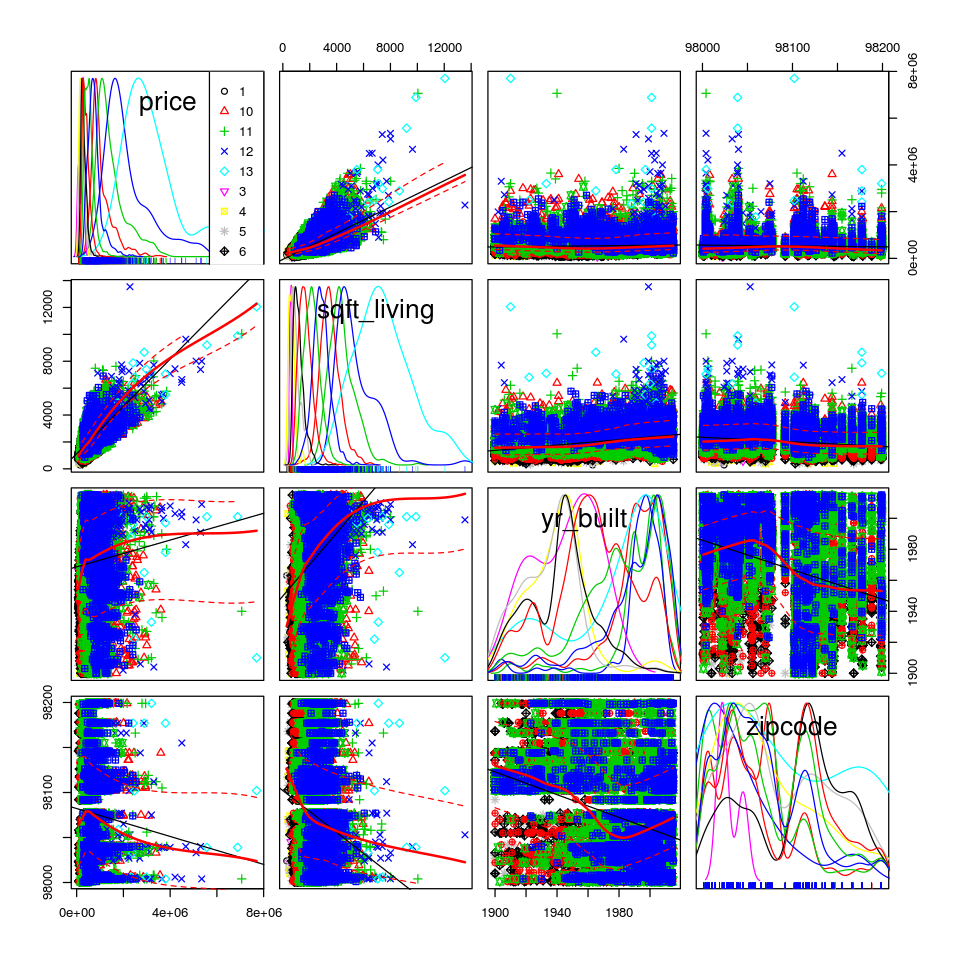

In [40]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + sqft_living 
                  + yr_built + zipcode
                  | grade 
                  
                  , data = kc.housing)

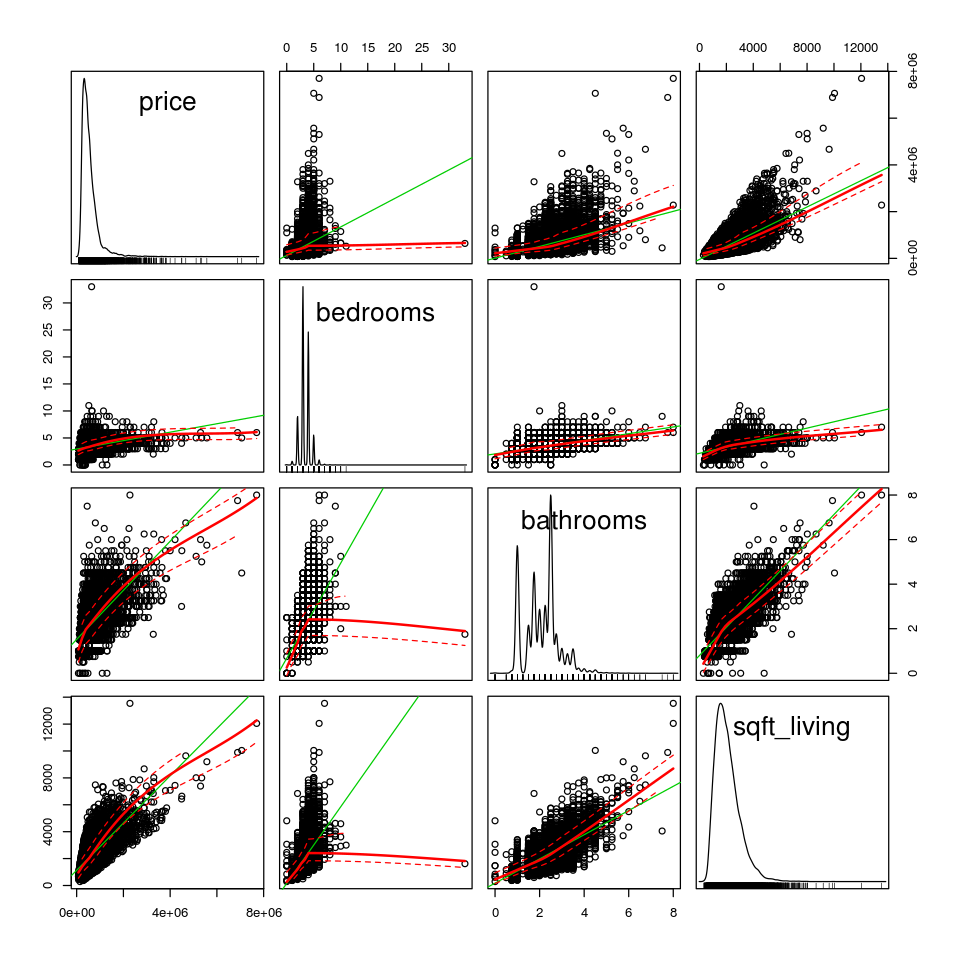

In [41]:
options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + bedrooms + bathrooms + sqft_living,
                  data = kc.housing)

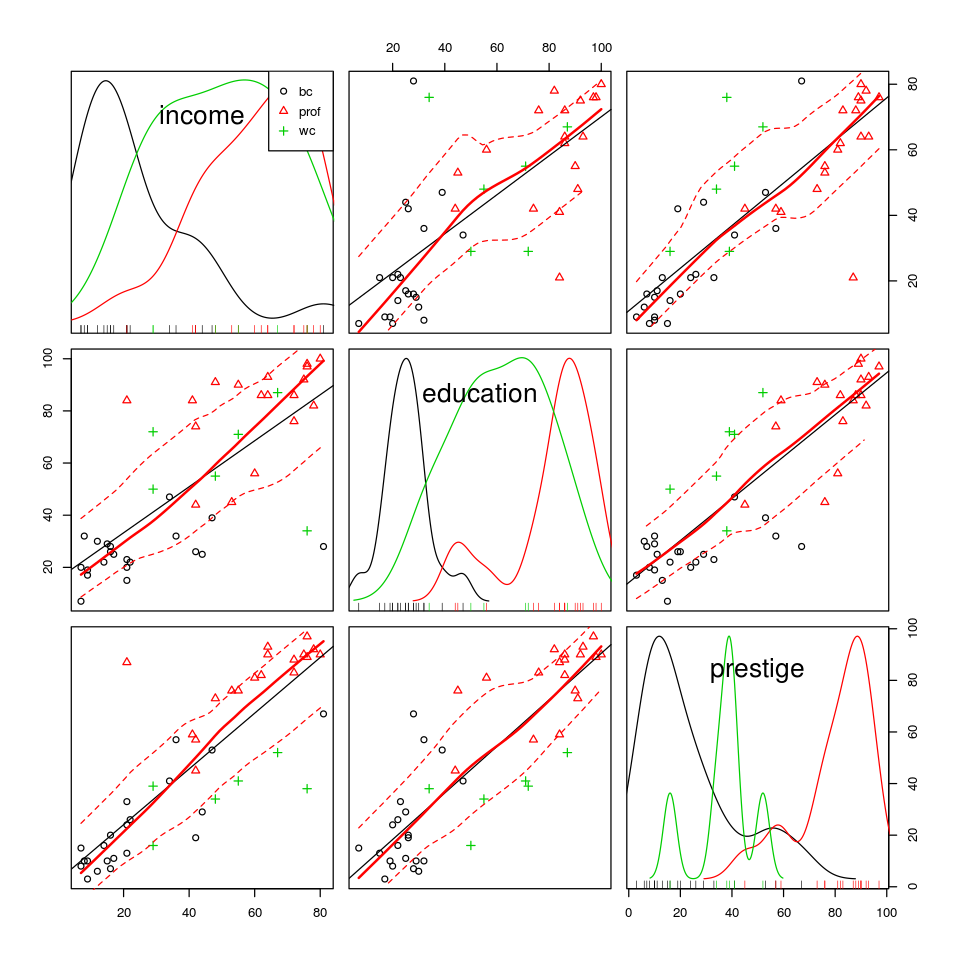

In [42]:
require(car)
scatterplotMatrix(~ income + education + prestige | type, data=Duncan)

In [43]:
str(Duncan)

'data.frame':	45 obs. of  4 variables:
 $ type     : Factor w/ 3 levels "bc","prof","wc": 2 2 2 2 2 2 2 2 3 2 ...
 $ income   : int  62 72 75 55 64 21 64 80 67 72 ...
 $ education: int  86 76 92 90 86 84 93 100 87 86 ...
 $ prestige : int  82 83 90 76 90 87 93 90 52 88 ...


In [44]:
table(Duncan$education)


  7  15  17  19  20  22  23  25  26  28  29  30  32  34  39  44  45  47  50  55 
  1   1   1   1   2   2   1   2   2   2   1   1   2   1   1   1   1   1   1   1 
 56  71  72  74  76  82  84  86  87  90  91  92  93  97  98 100 
  1   1   1   1   1   1   2   3   1   1   1   1   1   1   1   1 

Warning message in diag.panel(...):
“cannot estimate density for group 8
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 12
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 14
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 15
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 17
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”W

”Warning message in diag.panel(...):
“cannot estimate density for group 67
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 75
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 78
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 80
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 81
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically



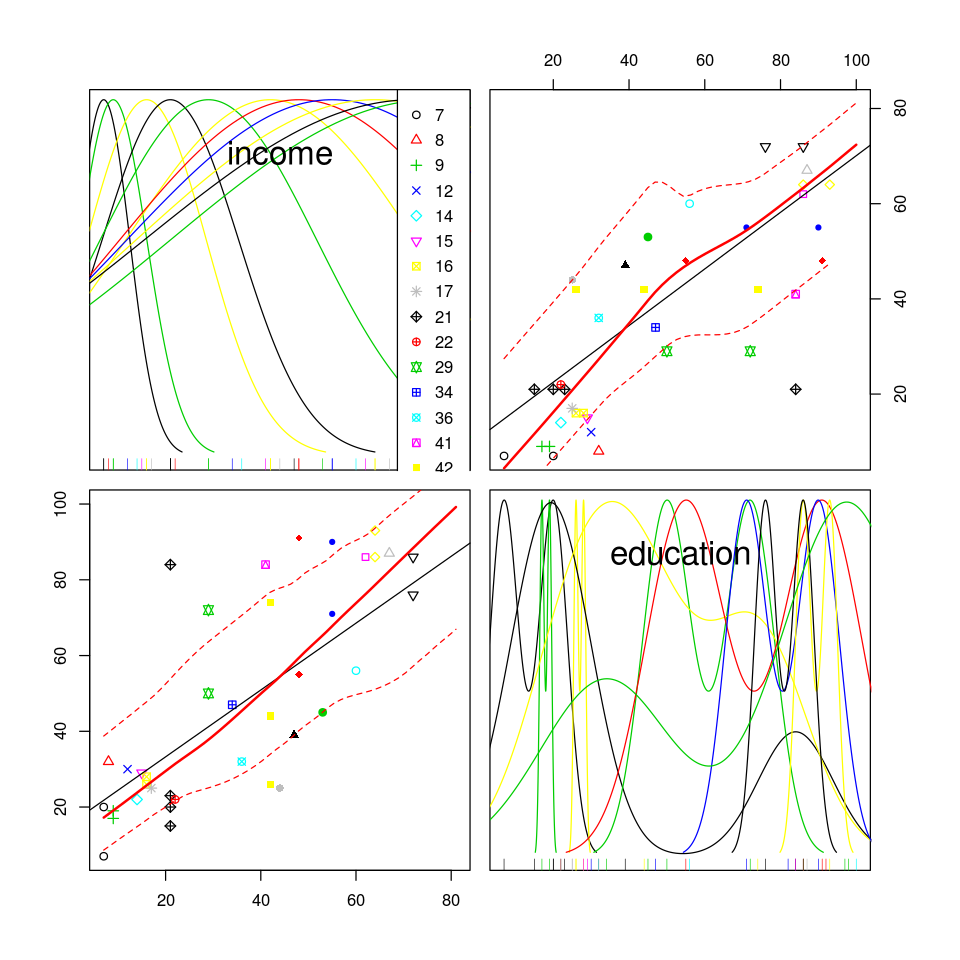

In [45]:
require(car)
scatterplotMatrix(~ income + education | factor(income), data=Duncan)

Warning message in diag.panel(...):
“cannot estimate density for group 1934
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1944
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1948
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1951
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1954
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automa

”Warning message in diag.panel(...):
“cannot estimate density for group 1944
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1948
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1951
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1954
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1959
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth autom

”Warning message in diag.panel(...):
“cannot estimate density for group 1954
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”Warning message in diag.panel(...):
“cannot estimate density for group 1959
Error in density.default(xx, adjust = adjust, na.rm = TRUE) : 
  need at least 2 points to select a bandwidth automatically

”

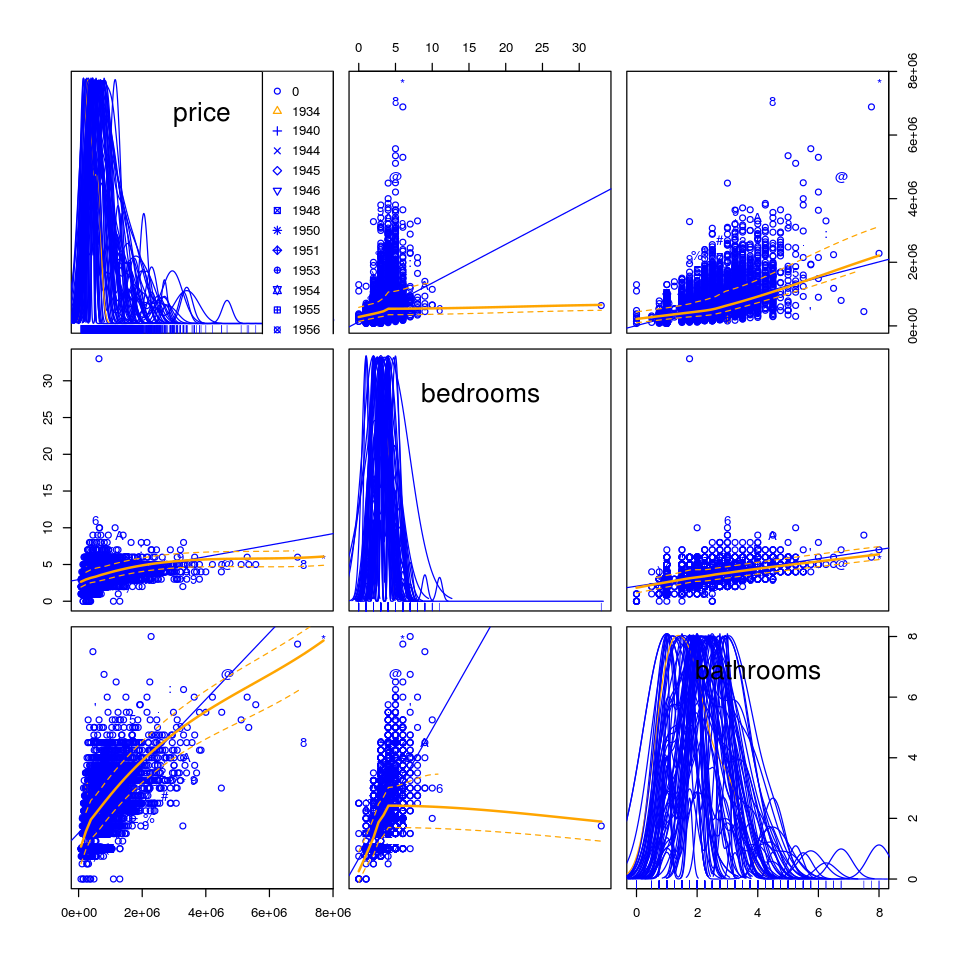

In [46]:
cols2 <- character(nrow(kc.housing))
cols2[] <- "black"
cols2[kc.housing$yr_renovated < 1990] <- "blue"
cols2[kc.housing$yr_renovated > 1990] <- "orange"

options(repr.plot.width=8, repr.plot.height=8)
require(car)
scatterplotMatrix(~ price + bedrooms + bathrooms|yr_renovated,
                  data = kc.housing, col = cols2)

In [47]:
par(bg="gray")

# cols2 <- character(nrow(bldg.energy))
# cols2[] <- "black"
# cols2[bldg.interesting$Overall.Height == 3.5] <- "green"
# cols2[bldg.interesting$Overall.Height == 7] <- "yellow"

# pairs(bldg.interesting[,0:4], col=cols2,
#      diag.panel = panel.hist,
#      upper.panel = panel.cor)

pairs(kc.housing[,0:22], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

ERROR: Error in `[.data.frame`(kc.housing, , 0:22): undefined columns selected


par(bg="gray")

panel.hist = function(x, ...){
  usr = par('usr')
  on.exit(par(usr))
  par(usr = c(usr[1:2], 0, 1.5))
  h = hist(x, plot=FALSE)
  breaks = h$breaks
  nB = length(breaks)
  y=h$counts
  y=y/max(y)
  rect(breaks[-nB], 0, breaks[-1], y, col='white')
}

panel.cor = function(x, y, digits=2, prefix="", cex.cor, ...){
  usr = par("usr")
  on.exit(par(usr))
  par(usr = c(0,1,0,1))
  r = abs(cor(x,y,use='complete.obs'))
  txt=format(c(r,0.123456789),digits=digits)[1]
  txt=paste(prefix,txt,sep='')
  if(missing(cex.cor)) cex.cor = 0.8/strwidth(txt)
  text(0.5, 0.5, txt, cex = cex.cor*(1+r)/2)
}
cols2 <- character(nrow(kc.housing))
cols2[] <- "black"
cols2[kc.housing$yr_renovated < 1990] <- "green"
cols2[kc.housing$yr_renovated > 1990] <- "yellow"

pairs(kc.housing[,3:10], col=cols2,
      diag.panel = panel.hist,
      upper.panel = panel.cor)

# pairs(kc.housing[,3:10], 
#      diag.panel = panel.hist,
#      upper.panel = panel.cor)

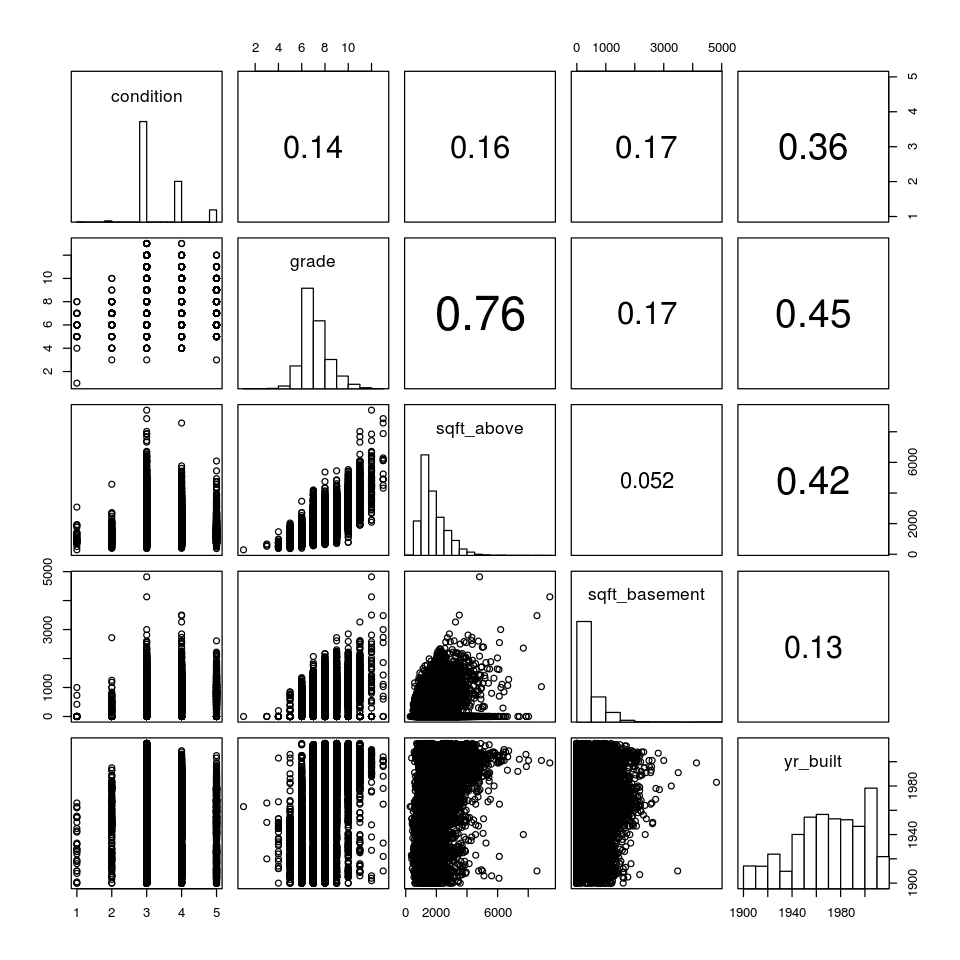

In [57]:
pairs(kc.housing[,11:15], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

In [58]:
str(kc.housing)

'data.frame':	21613 obs. of  21 variables:
 $ id           : num  7.13e+09 6.41e+09 5.63e+09 2.49e+09 1.95e+09 ...
 $ date         : chr  "20141013T000000" "20141209T000000" "20150225T000000" "20141209T000000" ...
 $ price        : num  221900 538000 180000 604000 510000 ...
 $ bedrooms     : int  3 3 2 4 3 4 3 3 3 3 ...
 $ bathrooms    : num  1 2.25 1 3 2 4.5 2.25 1.5 1 2.5 ...
 $ sqft_living  : int  1180 2570 770 1960 1680 5420 1715 1060 1780 1890 ...
 $ sqft_lot     : int  5650 7242 10000 5000 8080 101930 6819 9711 7470 6560 ...
 $ floors       : num  1 2 1 1 1 1 2 1 1 2 ...
 $ waterfront   : int  0 0 0 0 0 0 0 0 0 0 ...
 $ view         : int  0 0 0 0 0 0 0 0 0 0 ...
 $ condition    : int  3 3 3 5 3 3 3 3 3 3 ...
 $ grade        : int  7 7 6 7 8 11 7 7 7 7 ...
 $ sqft_above   : int  1180 2170 770 1050 1680 3890 1715 1060 1050 1890 ...
 $ sqft_basement: int  0 400 0 910 0 1530 0 0 730 0 ...
 $ yr_built     : int  1955 1951 1933 1965 1987 2001 1995 1963 1960 2003 ...
 $ yr_renovated :

In [59]:
table(kc.housing$yr_renovated)


    0  1934  1940  1944  1945  1946  1948  1950  1951  1953  1954  1955  1956 
20699     1     2     1     3     2     1     2     1     3     1     3     3 
 1957  1958  1959  1960  1962  1963  1964  1965  1967  1968  1969  1970  1971 
    3     5     1     4     2     4     5     5     2     8     4     9     2 
 1972  1973  1974  1975  1976  1977  1978  1979  1980  1981  1982  1983  1984 
    4     5     3     6     3     8     6    10    11     5    11    18    18 
 1985  1986  1987  1988  1989  1990  1991  1992  1993  1994  1995  1996  1997 
   17    17    18    15    22    25    20    17    19    19    16    15    15 
 1998  1999  2000  2001  2002  2003  2004  2005  2006  2007  2008  2009  2010 
   19    17    35    19    22    36    26    35    24    35    18    22    18 
 2011  2012  2013  2014  2015 
   13    11    37    91    16 

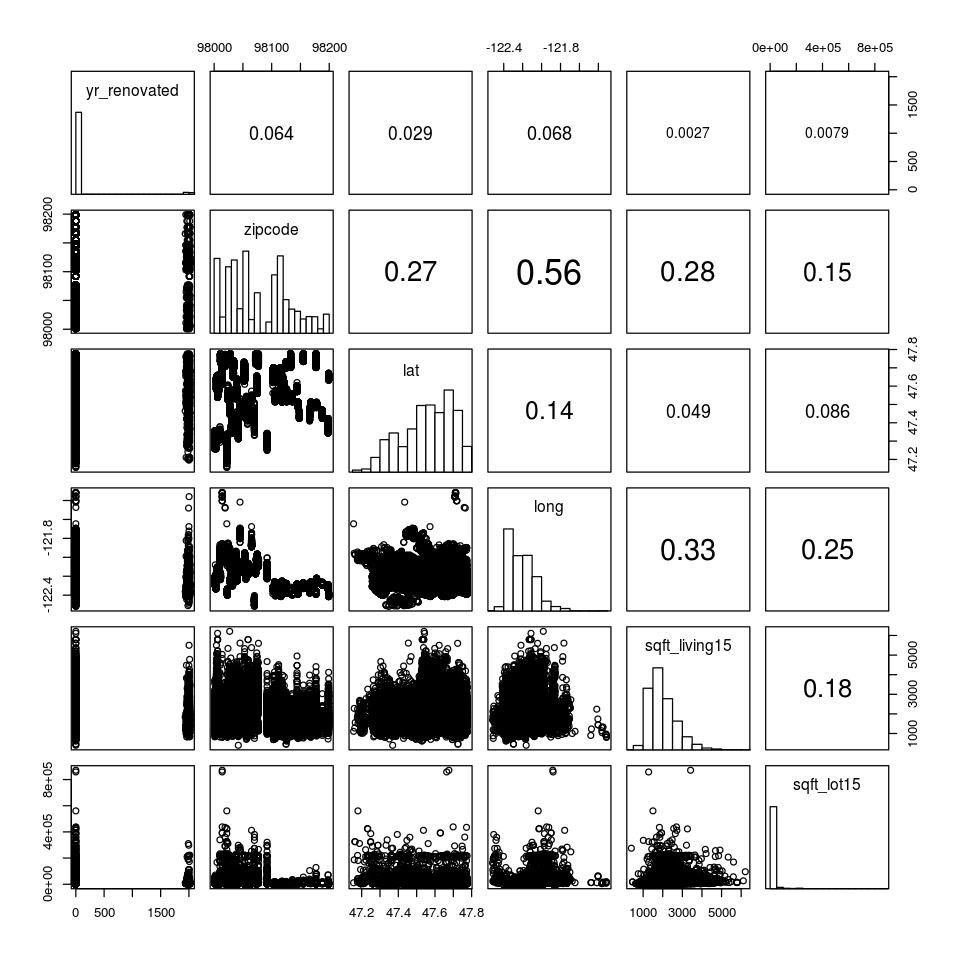

In [60]:
pairs(kc.housing[,16:21], 
      diag.panel = panel.hist,
      upper.panel = panel.cor)

# Price per Square foot, factored by floor count and age.

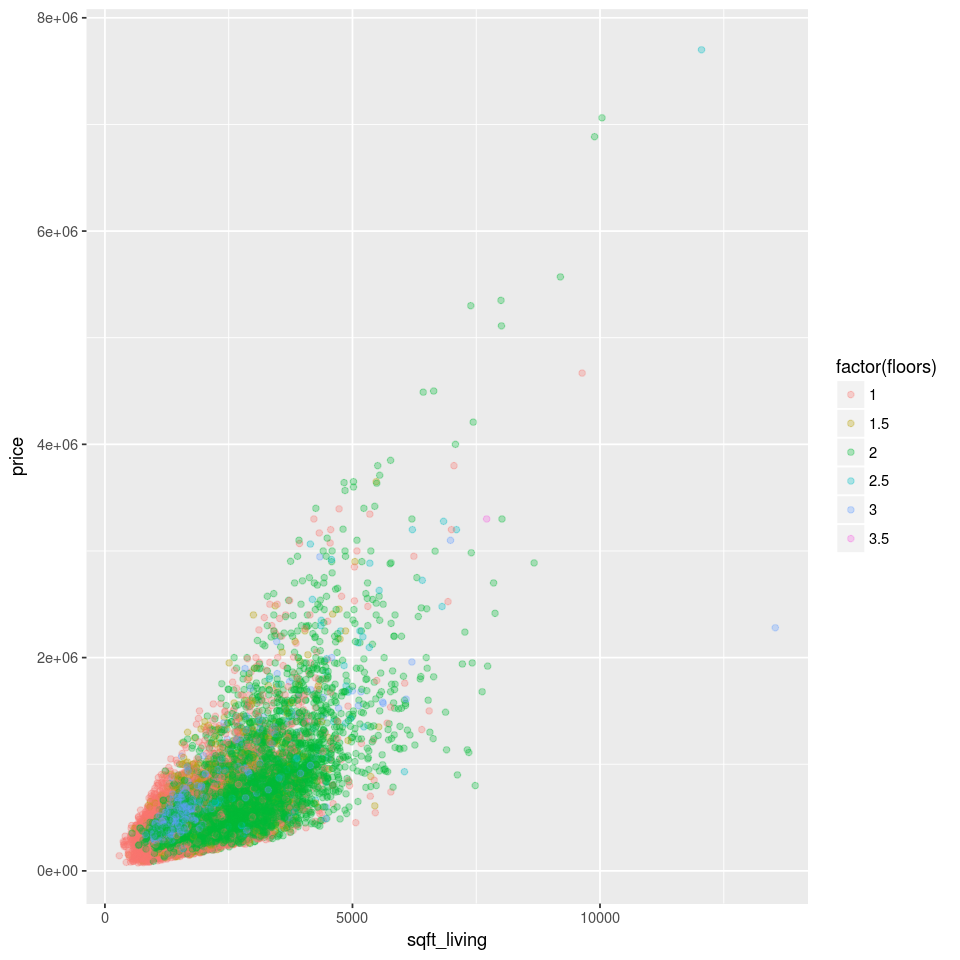

In [61]:
ggplot(kc.housing, aes(x = sqft_living, y = price)) +
geom_point(aes(color = factor(floors)), alpha = 0.3)